# Parallel Iterative SLSQP - All Test Cases
Runs `iterative_parallel` on every test case generated by `generate_test_cases.ipynb`.
Results are saved under `OUTPUT_DIR` alongside the input `.npy` files.

## Imports

In [ ]:
import os
import time
import glob

import numpy as np
import matplotlib.pyplot as plt

from dvfopt import jacobian_det2D, iterative_parallel
from dvfopt.viz import (
    plot_deformations,
    plot_grid_before_after,
    plot_checkerboard_before_after,
    plot_neg_jdet_neighborhoods,
)
from test_cases import (
    SYNTHETIC_CASES, RANDOM_DVF_CASES, REAL_DATA_SLICES,
    make_deformation, make_random_dvf, load_slice,
)

In [ ]:
INPUT_DIR = "data/test_cases"
OUTPUT_DIR = "output/test_cases/results/parallel_slsqp"
os.makedirs(OUTPUT_DIR, exist_ok=True)

# Stricter than the package default (0.01) to push corrections further
JDET_THRESHOLD = 0.001

## Helper

In [ ]:
from dvfopt.viz import plot_step_snapshot

def run_and_show(key, deformation, msample=None, fsample=None, **kwargs):
    """Run parallel correction, save outputs, print summary, and plot."""
    save_dir = f"{OUTPUT_DIR}/{key}"

    H, W = deformation.shape[-2:]
    jac_init = jacobian_det2D(np.stack([deformation[-2, 0], deformation[-1, 0]]))
    n_neg_init = int((jac_init <= 0).sum())
    n_below_thresh_init = int((jac_init <= JDET_THRESHOLD).sum())
    min_jdet_init = float(jac_init.min())

    print(f"\n{'='*70}")
    print(f"  {key}  |  {H}x{W}  |  neg Jdet: {n_neg_init}  "
          f"|  below threshold ({JDET_THRESHOLD}): {n_below_thresh_init}  "
          f"|  min Jdet: {min_jdet_init:.4f}")
    print(f"{'='*70}")

    # Show initial Jacobian heatmap before correction
    plot_step_snapshot(jac_init, 0, n_neg_init, min_jdet_init)

    t0 = time.perf_counter()
    phi = iterative_parallel(
        deformation.copy(), save_path=save_dir, verbose=1,
        threshold=JDET_THRESHOLD, plot_every=1, **kwargs
    )
    elapsed = time.perf_counter() - t0

    jac_final = jacobian_det2D(phi)
    n_neg_final = int((jac_final <= 0).sum())
    n_below_thresh_final = int((jac_final <= JDET_THRESHOLD).sum())
    min_jdet_final = float(jac_final.min())
    l2 = float(np.sqrt(np.sum((phi - np.stack([deformation[-2, 0], deformation[-1, 0]]))**2)))

    print(f"  Time: {elapsed:.2f}s  |  neg Jdet: {n_neg_init} -> {n_neg_final}  "
          f"|  below threshold: {n_below_thresh_init} -> {n_below_thresh_final}  "
          f"|  min Jdet: {min_jdet_init:.4f} -> {min_jdet_final:.4f}  |  L2: {l2:.4f}")

    plot_deformations(msample, fsample, deformation, phi, title=key)
    plot_grid_before_after(deformation, phi, title=key)
    plot_grid_before_after(deformation, phi, title=key, inverse=True)
    plot_checkerboard_before_after(deformation, phi, title=key)
    plot_neg_jdet_neighborhoods(deformation, phi, title=key)

## Case 1 - Small synthetic grids


  01a_10x10_crossing  |  10x10  |  neg Jdet: 9  |  below threshold (0.001): 9  |  min Jdet: -1.0246


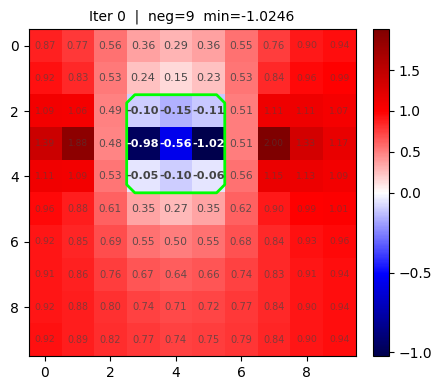

[init] Grid 10x10  |  threshold=0.001  |  method=SLSQP  |  workers=24
[init] Neg-Jdet pixels: 9  |  min Jdet: -1.024567
[iter    1]  serial  fix (  3,  5)  neg_pixels=9
         -> neg_jdet     0  min_jdet +0.001000  L2 2.2338  win 7x7  sub-iters 2


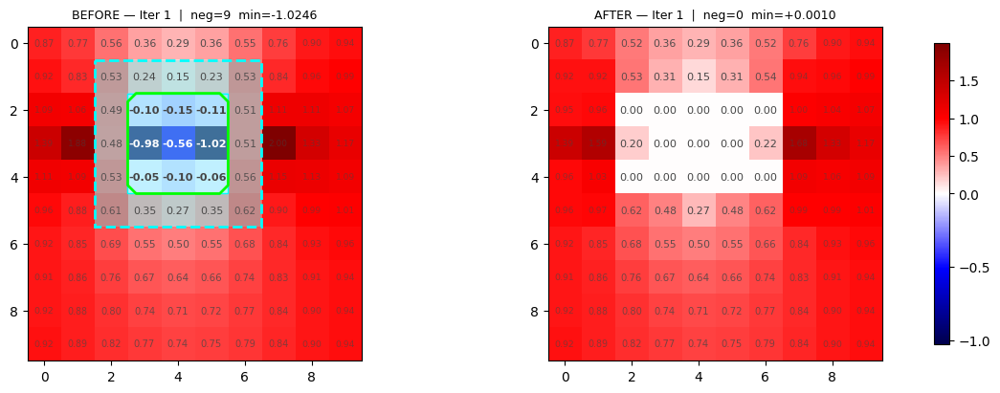

[done] All Jdet > threshold after iter 1

  SUMMARY  (SLSQP — hybrid parallel)
------------------------------------------------------------
  Grid size        : 10 x 10
  Iterations       : 1  (serial=1, parallel=0)
  Neg-Jdet      9 ->     0
  Min Jdet  -1.024567 -> +0.001000
  L2 error         : 2.233826
  Time             : 0.63s
  Time: 0.64s  |  neg Jdet: 9 -> 0  |  below threshold: 9 -> 7  |  min Jdet: -1.0246 -> 0.0010  |  L2: 2.2338
            x-disp min  x-disp max  y-disp min  y-disp max    Jdet min    Jdet max  neg Jdet
--------------------------------------------------------------------------------------------
   initial     -3.9997      3.9997     -2.0200     -1.9739     -1.0246      1.9968         9
 corrected     -3.9048      3.9055     -3.0064     -0.9976      0.0010      1.6791         0


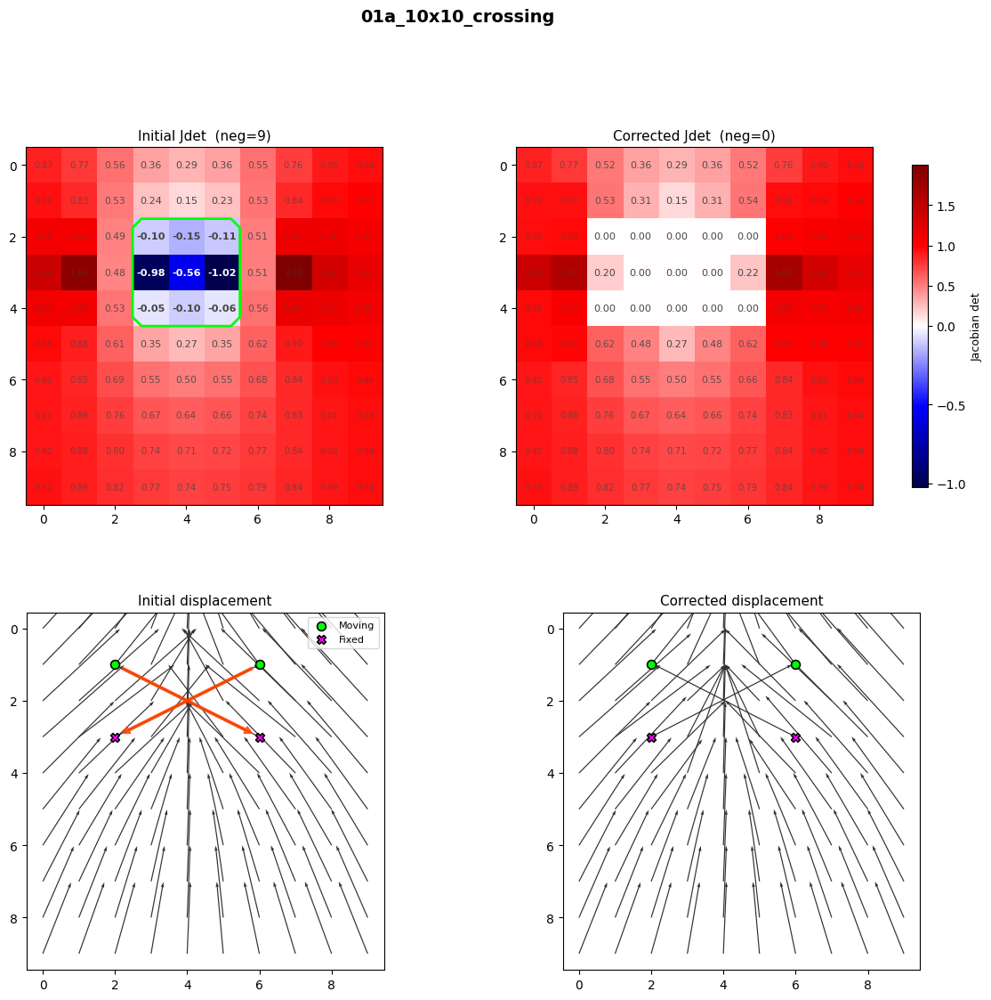

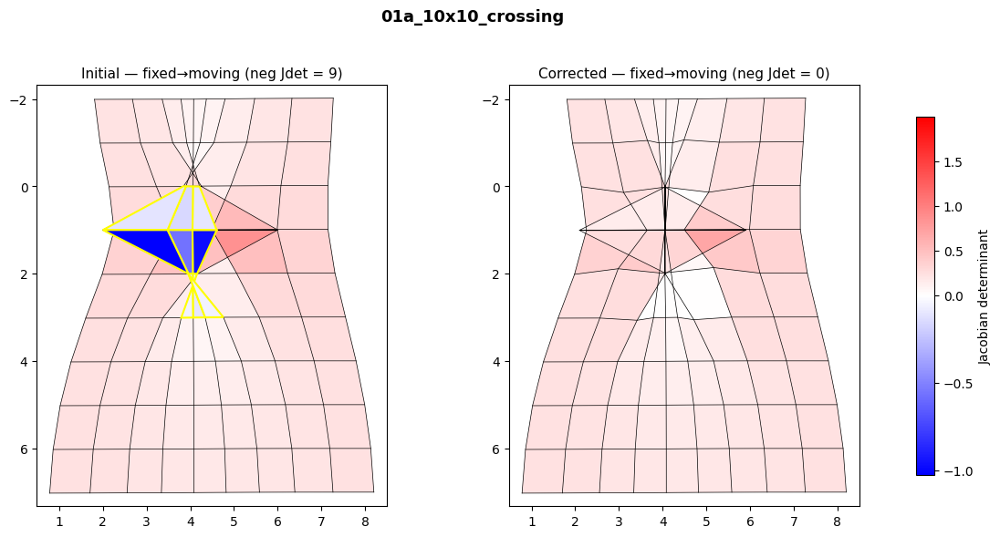

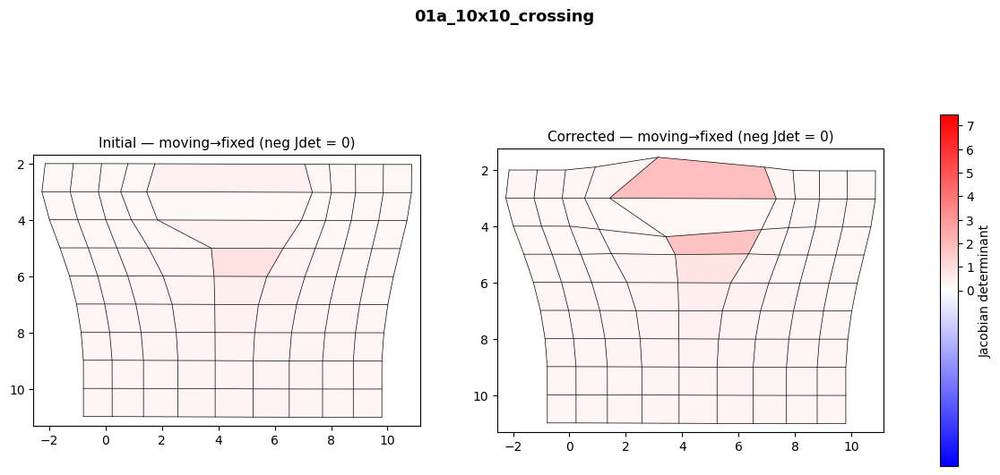

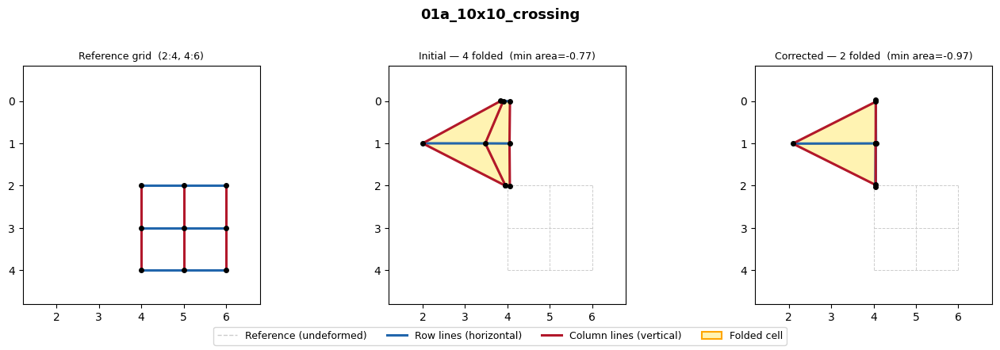

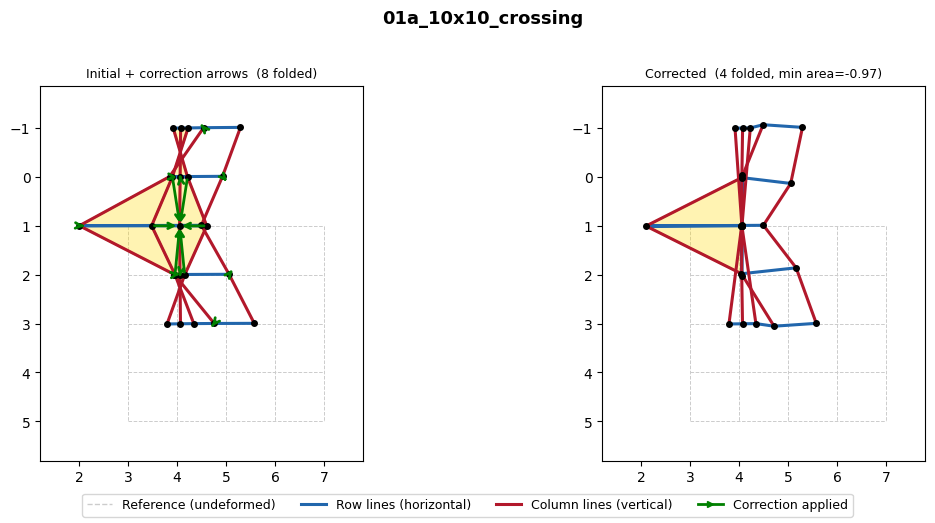

In [4]:
deformation, ms, fs = make_deformation("01a_10x10_crossing")
run_and_show("01a_10x10_crossing", deformation, ms, fs)


  01b_10x10_opposite  |  10x10  |  neg Jdet: 6  |  below threshold (0.001): 6  |  min Jdet: -1.1540


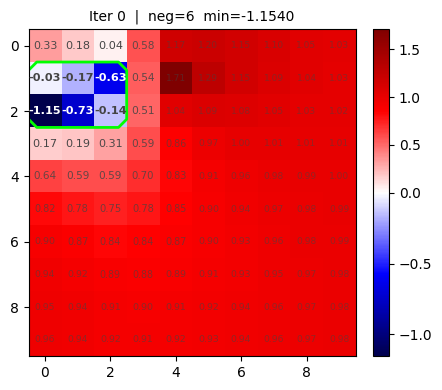

[init] Grid 10x10  |  threshold=0.001  |  method=SLSQP  |  workers=24
[init] Neg-Jdet pixels: 6  |  min Jdet: -1.154032
[iter    1]  serial  fix (  2,  1)  neg_pixels=4
         -> neg_jdet     0  min_jdet +0.001000  L2 1.4558  win 4x4  sub-iters 1


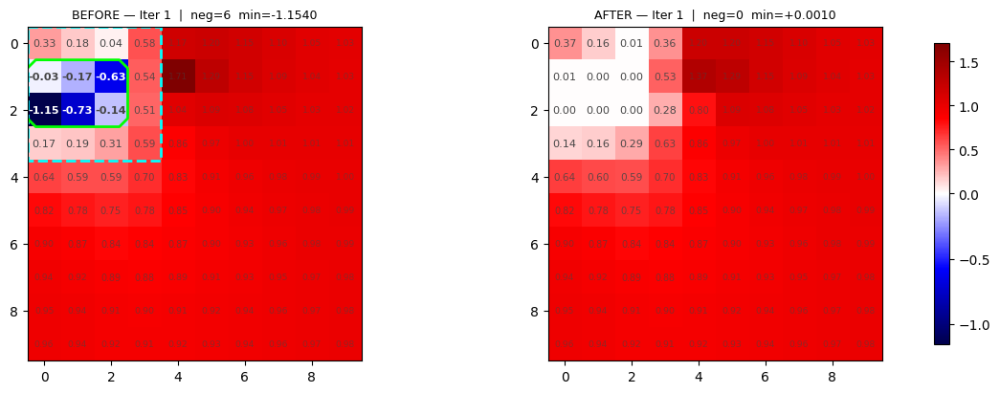

[done] All Jdet > threshold after iter 1

  SUMMARY  (SLSQP — hybrid parallel)
------------------------------------------------------------
  Grid size        : 10 x 10
  Iterations       : 1  (serial=1, parallel=0)
  Neg-Jdet      6 ->     0
  Min Jdet  -1.154032 -> +0.001000
  L2 error         : 1.455812
  Time             : 0.42s
  Time: 0.42s  |  neg Jdet: 6 -> 0  |  below threshold: 6 -> 1  |  min Jdet: -1.1540 -> 0.0010  |  L2: 1.4558
            x-disp min  x-disp max  y-disp min  y-disp max    Jdet min    Jdet max  neg Jdet
--------------------------------------------------------------------------------------------
   initial     -2.9998      2.9998      0.0000      0.0000     -1.1540      1.7091         6
 corrected     -2.3861      2.1697     -0.3453      0.3147      0.0010      1.3669         0


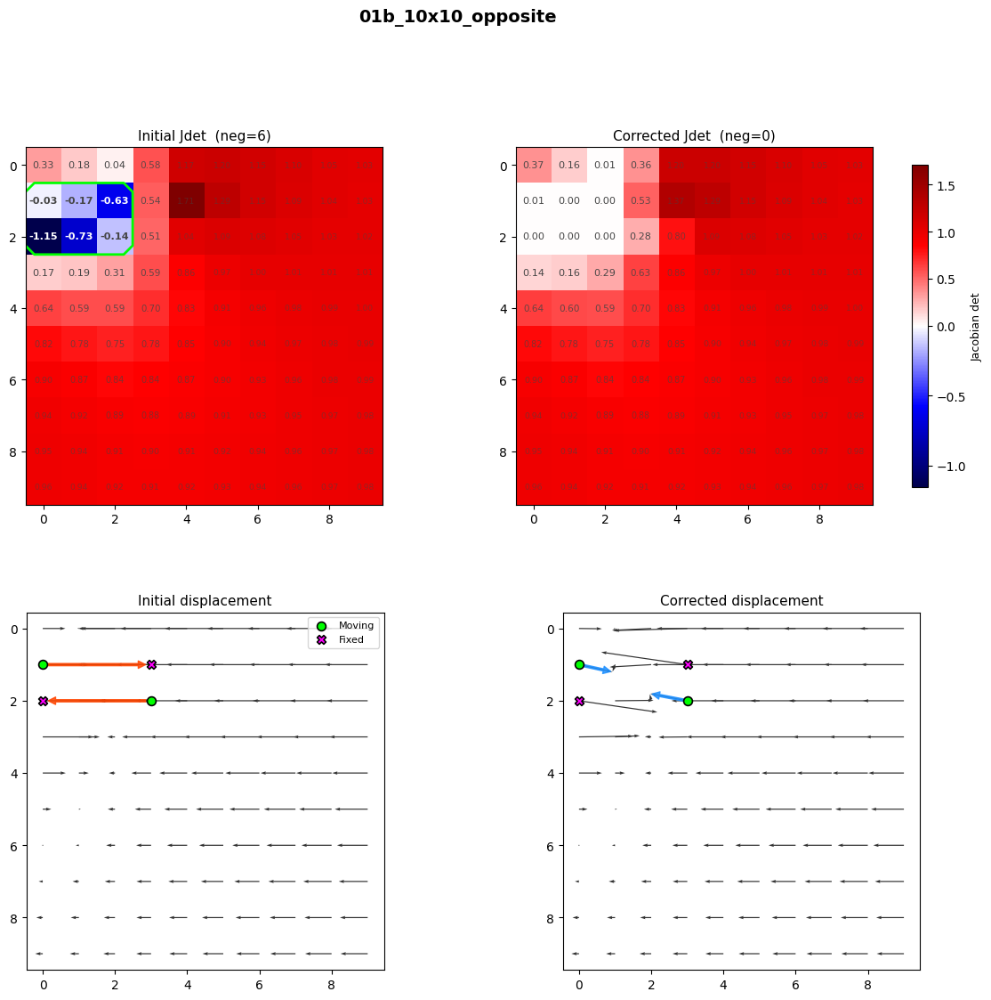

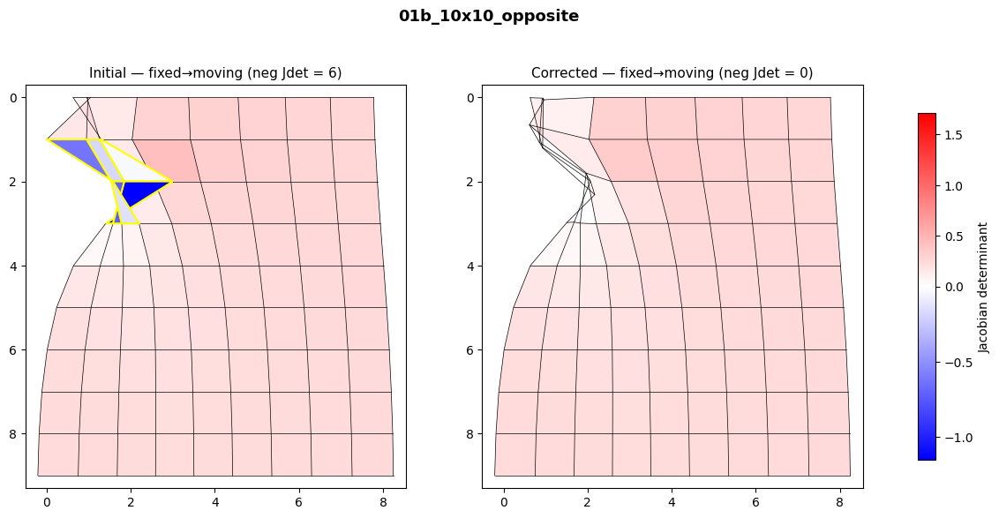

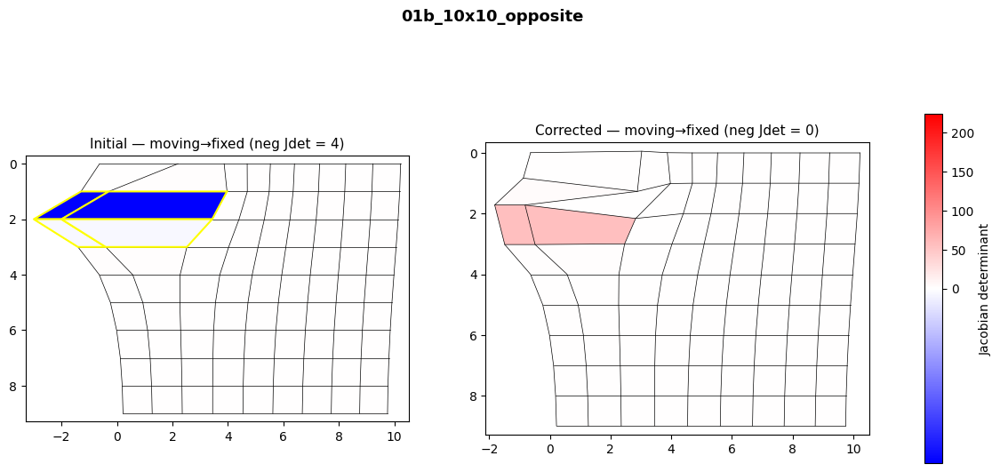

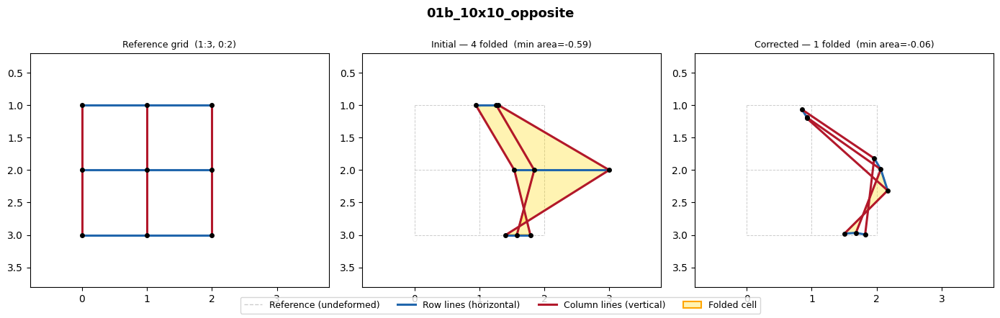

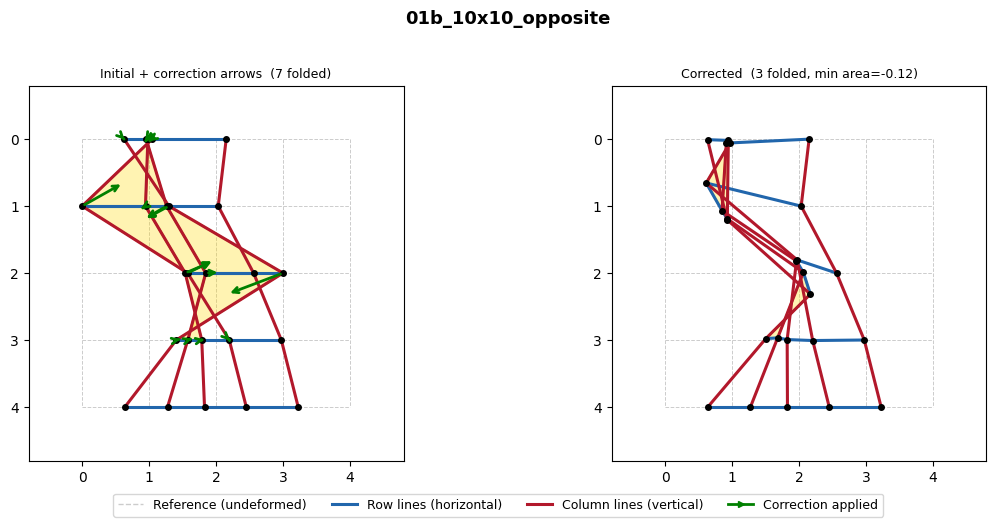

In [5]:
deformation, ms, fs = make_deformation("01b_10x10_opposite")
run_and_show("01b_10x10_opposite", deformation, ms, fs)


  01c_20x40_edges  |  20x40  |  neg Jdet: 29  |  below threshold (0.001): 29  |  min Jdet: -1.3430


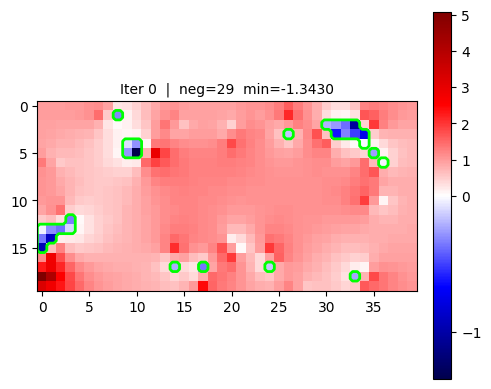

[init] Grid 20x40  |  threshold=0.001  |  method=SLSQP  |  workers=24
[init] Neg-Jdet pixels: 29  |  min Jdet: -1.343039
[iter    1]  parallel  batch=9  neg_pixels=26  windows=4x4,5x7,6x5,3x3,3x3,3x3,3x3,3x3,3x3
         -> neg_jdet     9  min_jdet -1.423926  L2 3.6488


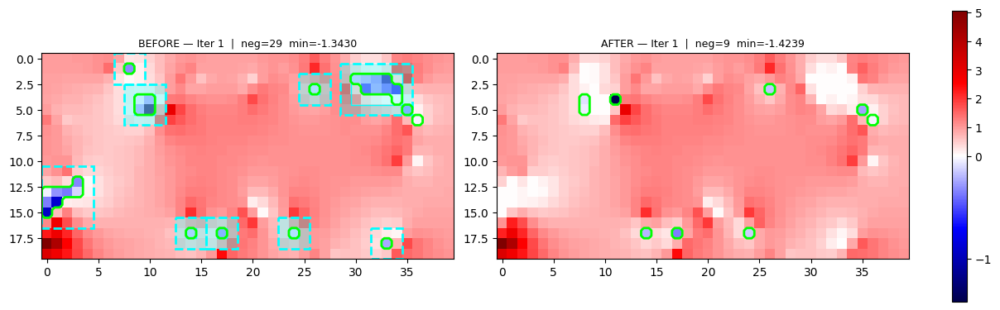

[iter    2]  parallel  batch=6  neg_pixels=9  windows=3x3,5x5,3x3,5x5,5x5,4x3
         -> neg_jdet     5  min_jdet -1.423926  L2 3.7884


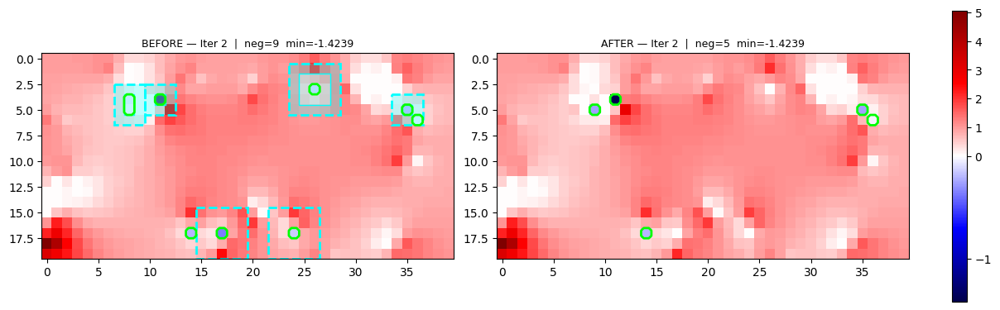

[iter    3]  parallel  batch=3  neg_pixels=5  windows=5x5,5x5,3x3
         -> neg_jdet     5  min_jdet -0.493609  L2 3.7019
  [escalate] parallel didn't improve (5->5), global min window -> 5x5


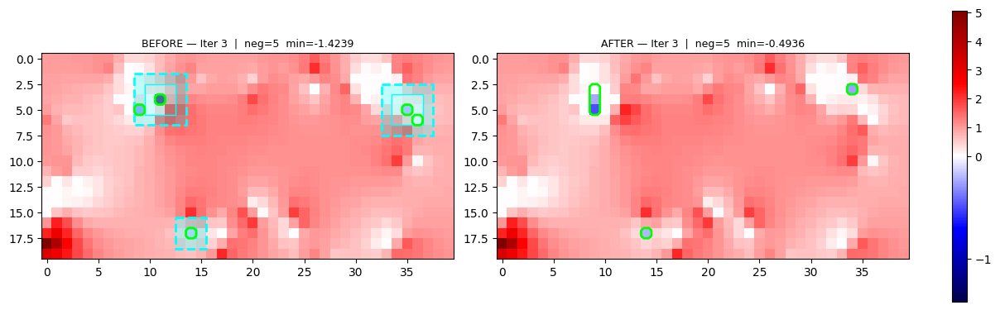

[iter    4]  parallel  batch=3  neg_pixels=5  windows=5x5,5x5,5x5
         -> neg_jdet     5  min_jdet -0.454404  L2 3.4707
  [escalate] parallel didn't improve (5->5), global min window -> 7x7


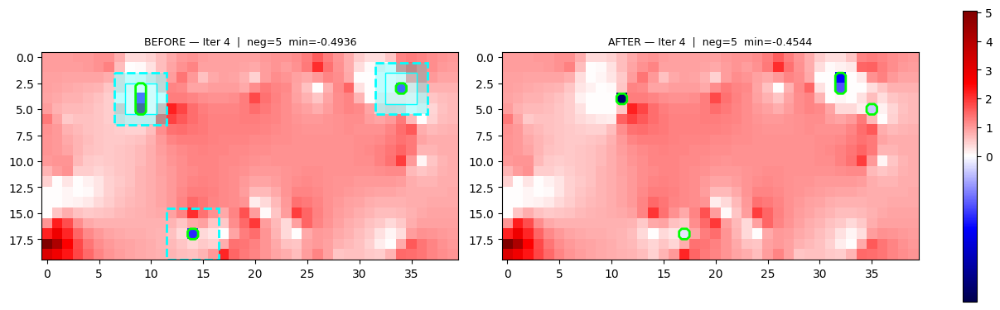

[iter    5]  parallel  batch=3  neg_pixels=5  windows=7x7,7x7,7x7
         -> neg_jdet     4  min_jdet -0.185752  L2 2.9281


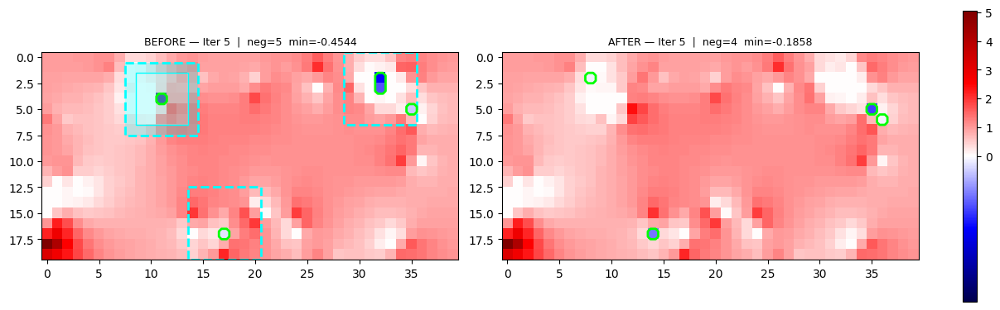

[iter    6]  parallel  batch=3  neg_pixels=4  windows=7x7,7x7,7x7
         -> neg_jdet     2  min_jdet -0.411132  L2 3.1112


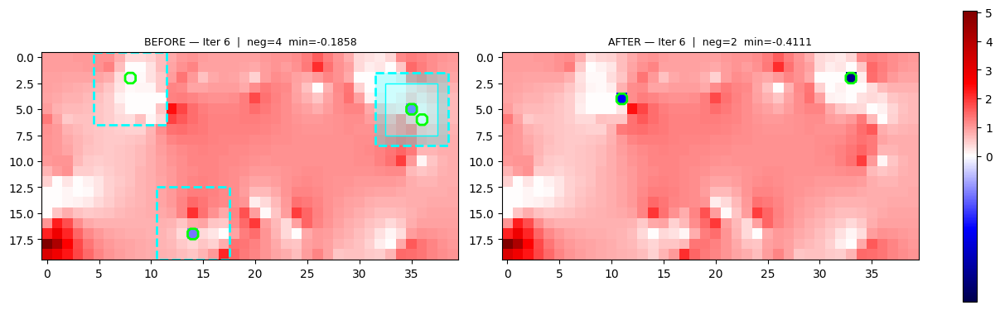

[iter    7]  parallel  batch=2  neg_pixels=2  windows=7x7,7x7
         -> neg_jdet     2  min_jdet -0.091436  L2 3.0849
  [escalate] parallel didn't improve (2->2), global min window -> 9x9


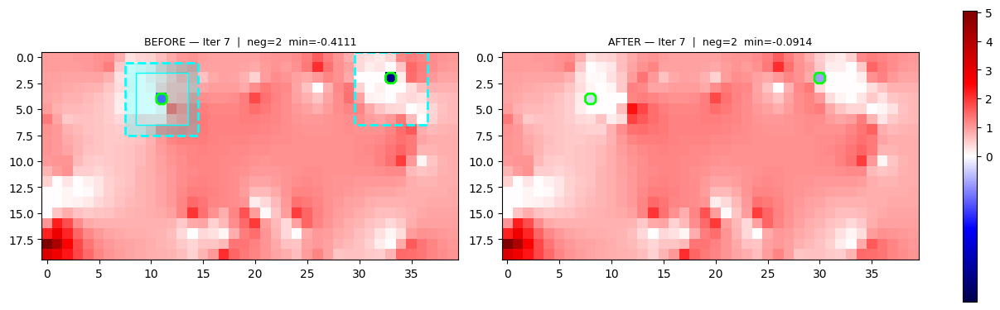

[iter    8]  parallel  batch=2  neg_pixels=2  windows=9x9,9x9
         -> neg_jdet     3  min_jdet -0.454408  L2 3.0832
  [escalate] parallel didn't improve (2->3), global min window -> 11x11


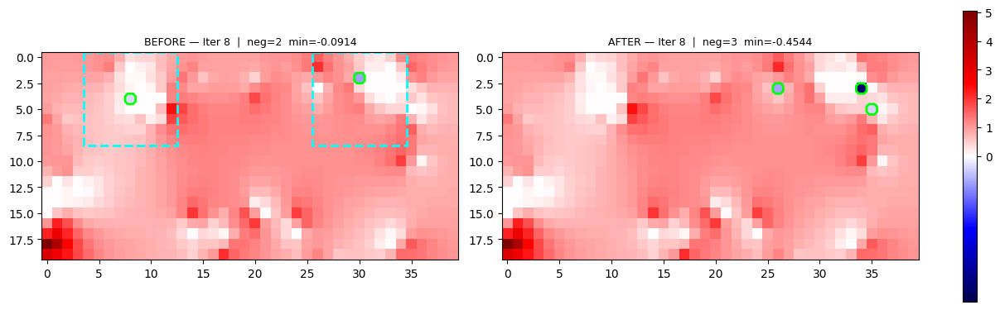

[iter    9]  serial  fix (  3, 34)  neg_pixels=3
         -> neg_jdet     1  min_jdet -0.087403  L2 2.9390  win 13x13  sub-iters 5


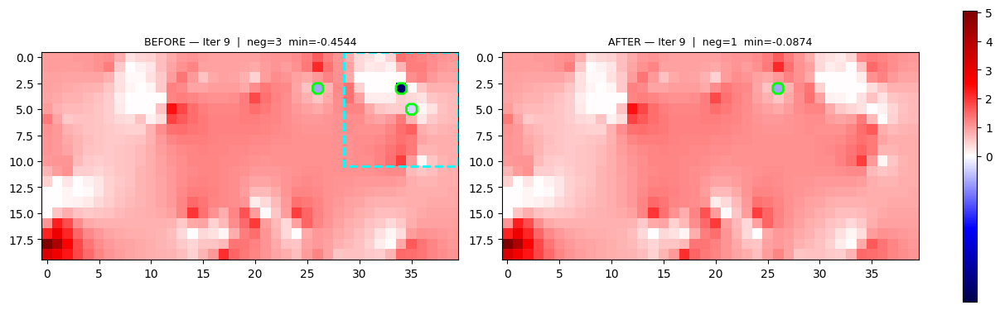

[iter   10]  serial  fix (  3, 26)  neg_pixels=1
         -> neg_jdet     0  min_jdet +0.001000  L2 2.9433  win 5x5  sub-iters 2


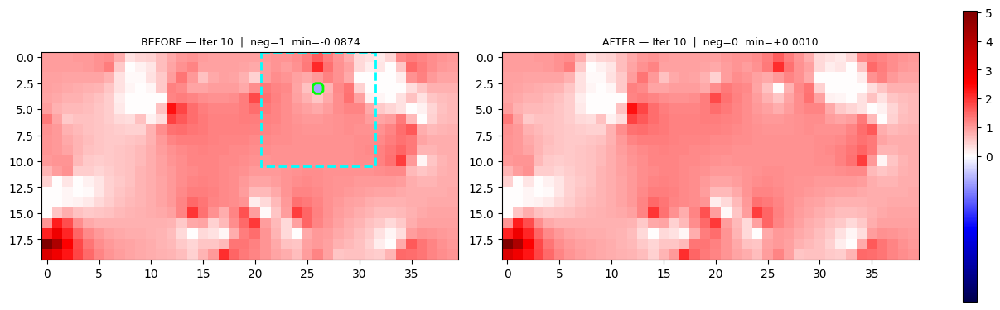

[done] All Jdet > threshold after iter 10

  SUMMARY  (SLSQP — hybrid parallel)
------------------------------------------------------------
  Grid size        : 20 x 40
  Iterations       : 10  (serial=2, parallel=8)
  Neg-Jdet     29 ->     0
  Min Jdet  -1.343039 -> +0.001000
  L2 error         : 2.943292
  Time             : 14.35s
  Time: 14.36s  |  neg Jdet: 29 -> 0  |  below threshold: 29 -> 10  |  min Jdet: -1.3430 -> 0.0010  |  L2: 2.9433
            x-disp min  x-disp max  y-disp min  y-disp max    Jdet min    Jdet max  neg Jdet
--------------------------------------------------------------------------------------------
   initial     -6.9994      4.9996     -4.9996      3.9997     -1.3430      5.0673        29
 corrected     -6.9994      4.9133     -4.9996      3.8457      0.0010      5.0673         0


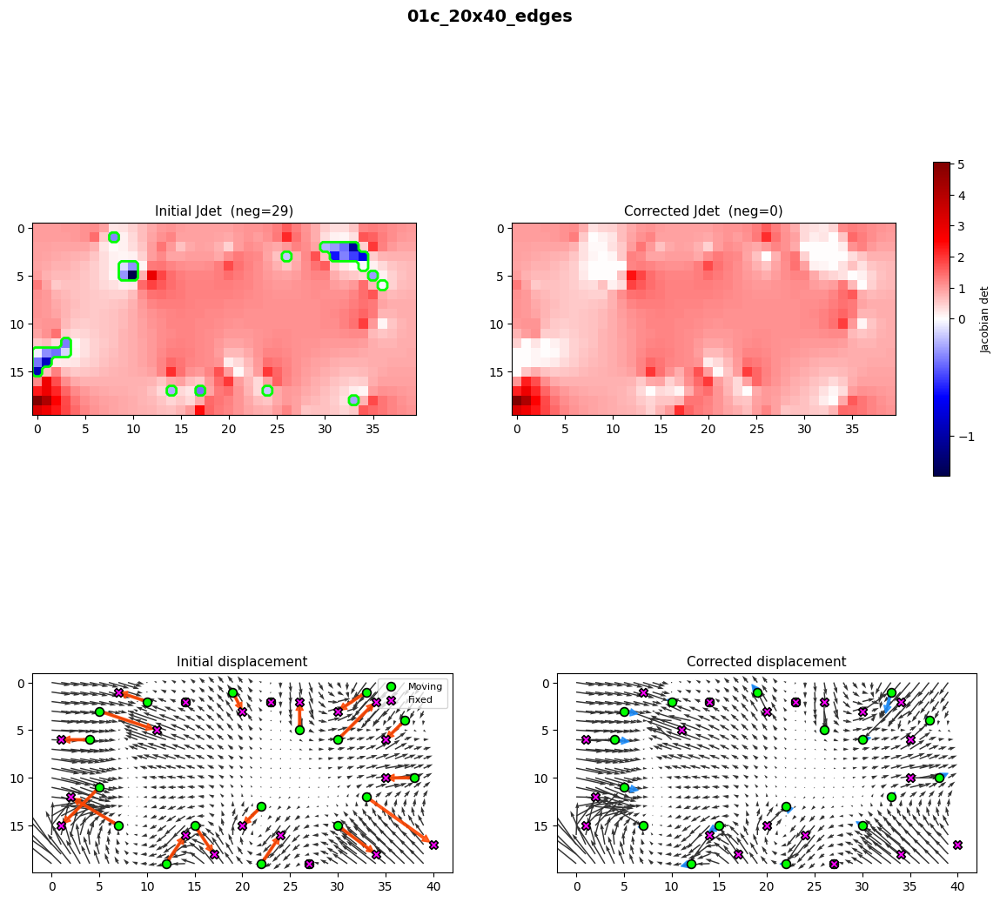

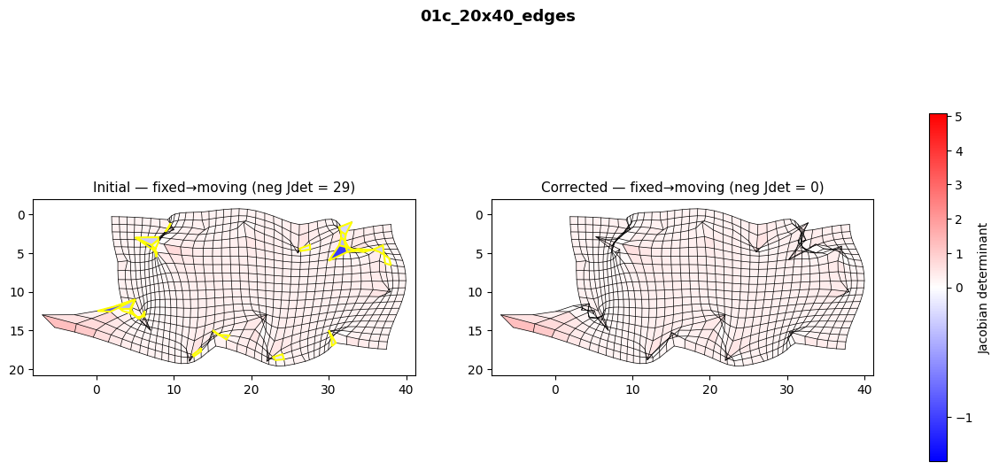

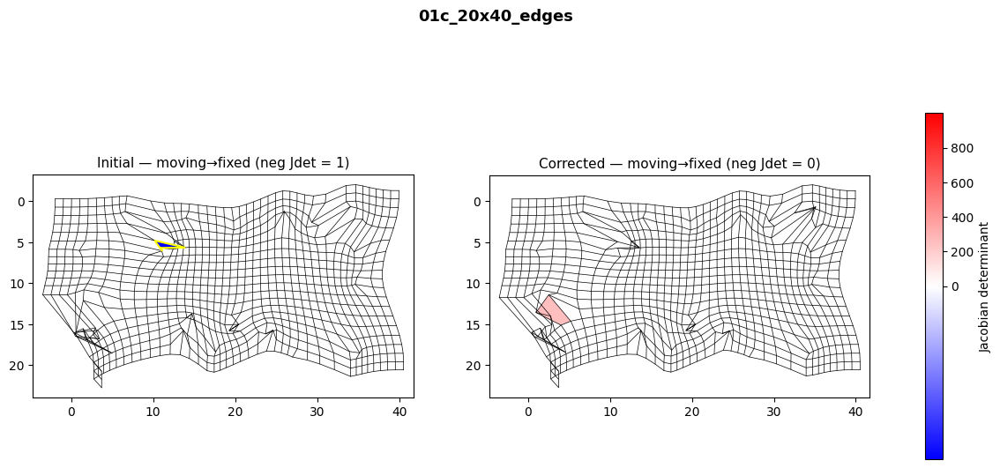

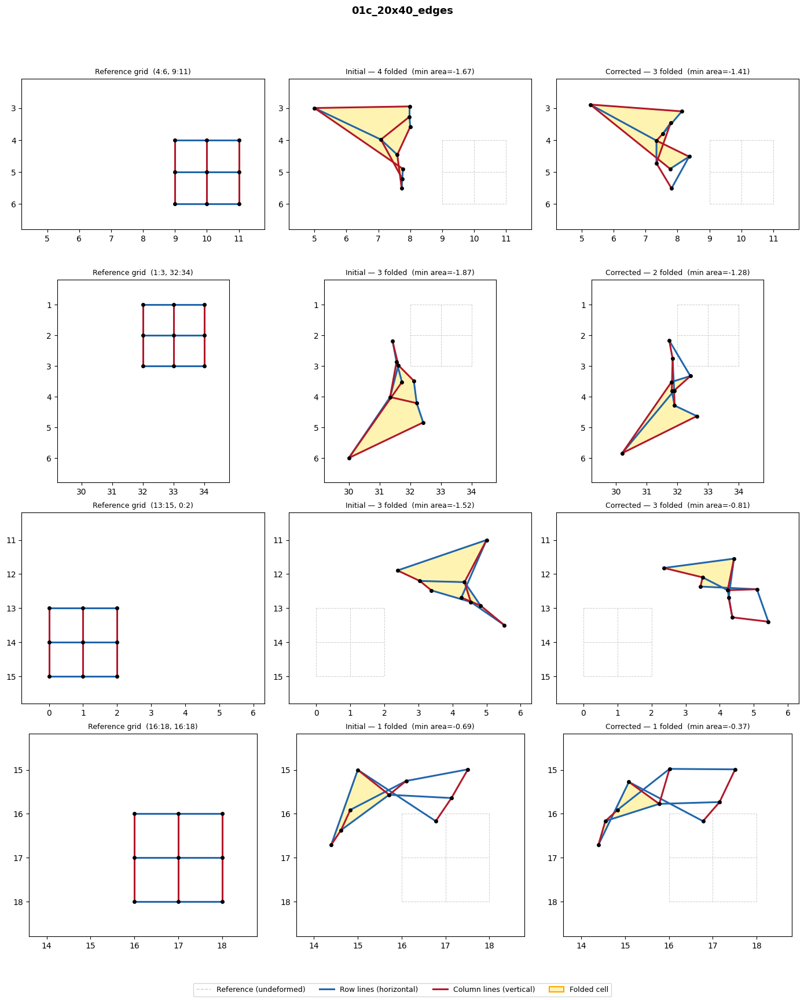

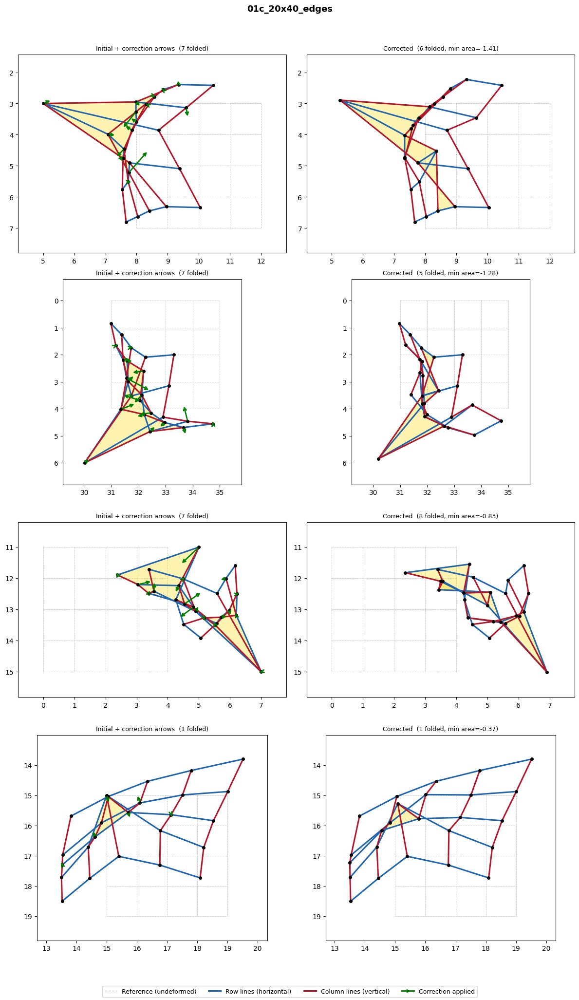

In [6]:
deformation, ms, fs = make_deformation("01c_20x40_edges")
run_and_show("01c_20x40_edges", deformation, ms, fs)


  01d_20x40_crossing  |  20x40  |  neg Jdet: 158  |  below threshold (0.001): 158  |  min Jdet: -3.3699


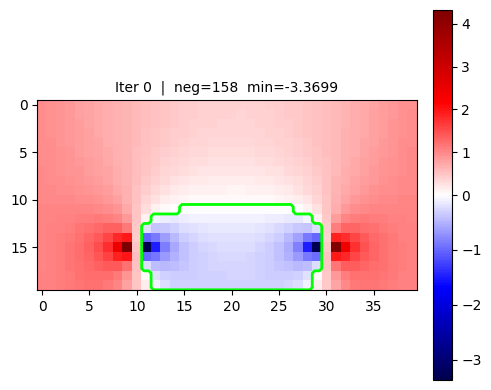

[init] Grid 20x40  |  threshold=0.001  |  method=SLSQP  |  workers=24
[init] Neg-Jdet pixels: 158  |  min Jdet: -3.369923
[iter    1]  serial  fix ( 15, 11)  neg_pixels=141
         -> neg_jdet     0  min_jdet +0.001000  L2 15.9599  win 14x25  sub-iters 3


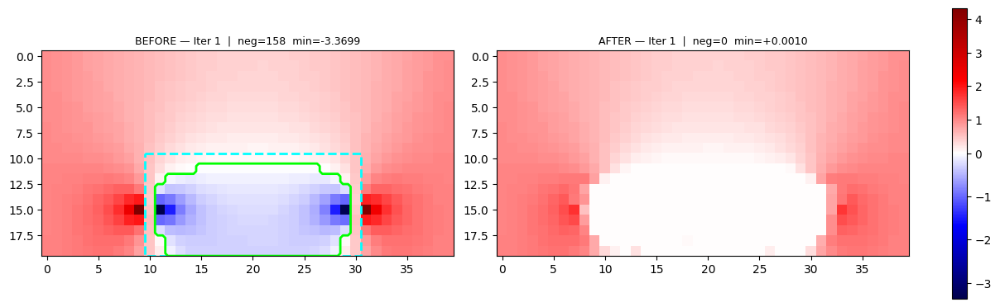

[done] All Jdet > threshold after iter 1

  SUMMARY  (SLSQP — hybrid parallel)
------------------------------------------------------------
  Grid size        : 20 x 40
  Iterations       : 1  (serial=1, parallel=0)
  Neg-Jdet    158 ->     0
  Min Jdet  -3.369923 -> +0.001000
  L2 error         : 15.959879
  Time             : 14.57s
  Time: 14.57s  |  neg Jdet: 158 -> 0  |  below threshold: 158 -> 84  |  min Jdet: -3.3699 -> 0.0010  |  L2: 15.9599
            x-disp min  x-disp max  y-disp min  y-disp max    Jdet min    Jdet max  neg Jdet
--------------------------------------------------------------------------------------------
   initial    -19.9765     19.9765    -10.0017     -9.2890     -3.3699      4.3267       158
 corrected    -19.9640     19.9530    -12.4030     -7.4494      0.0010      1.7330         0


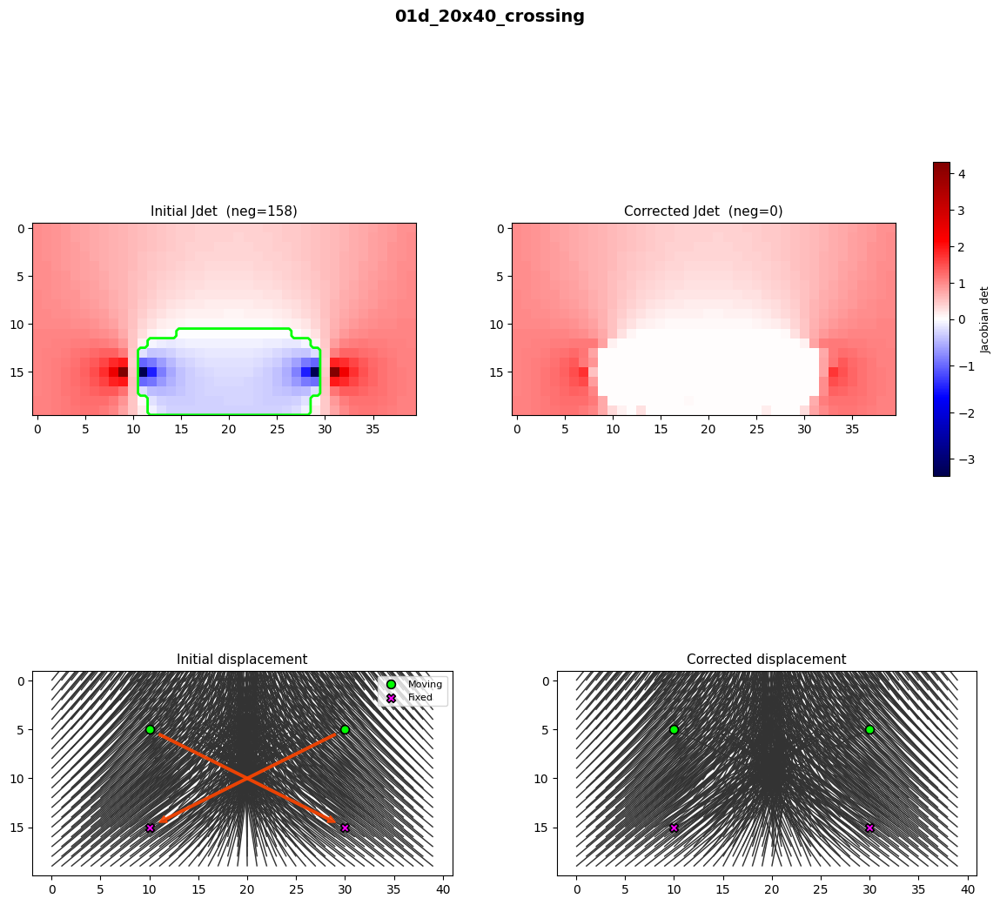

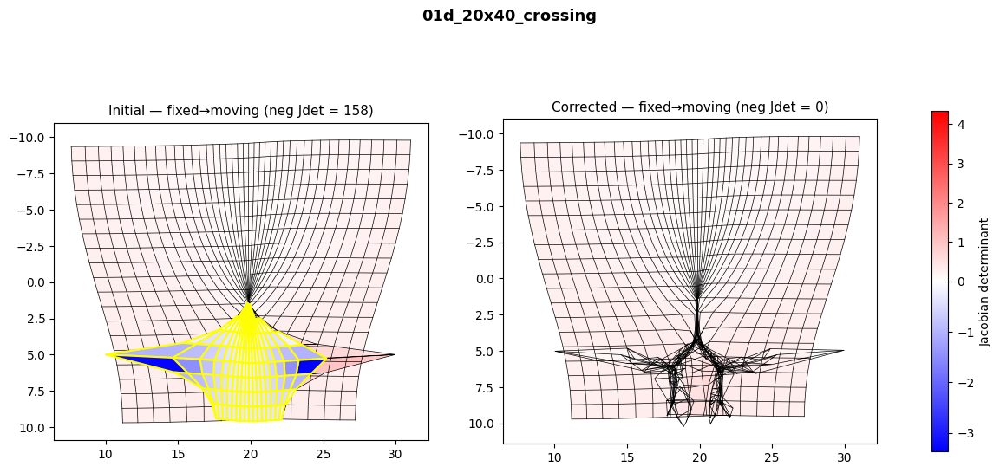

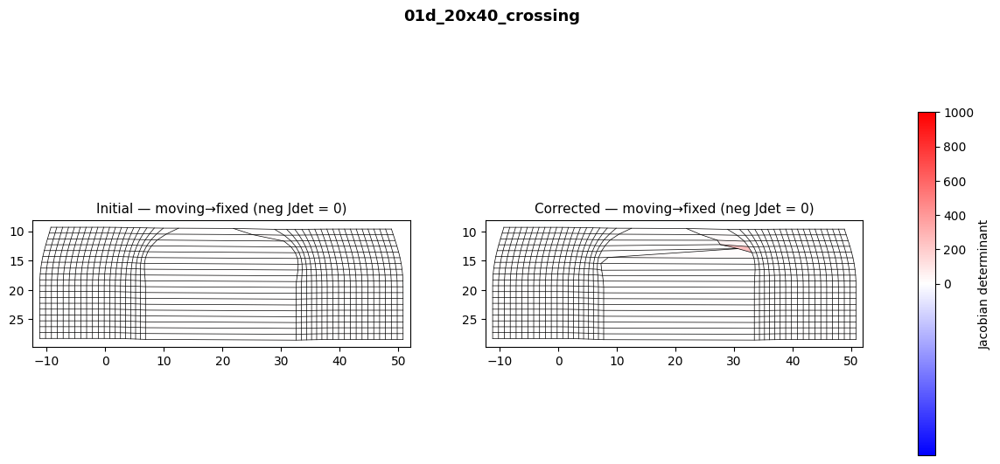

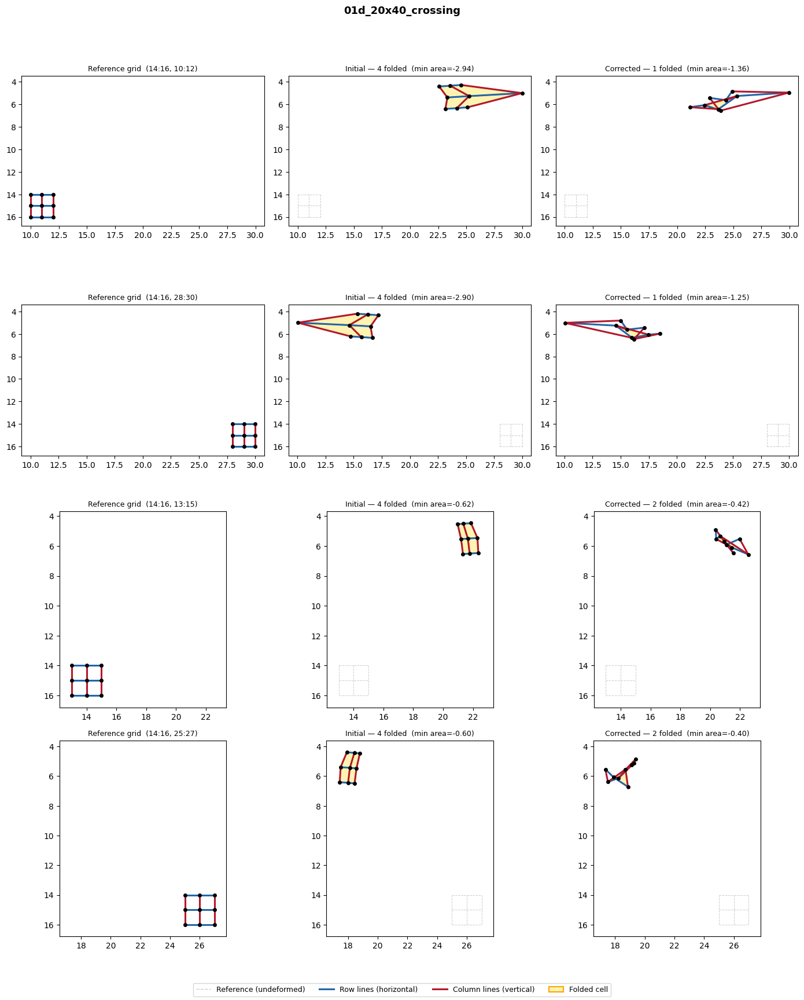

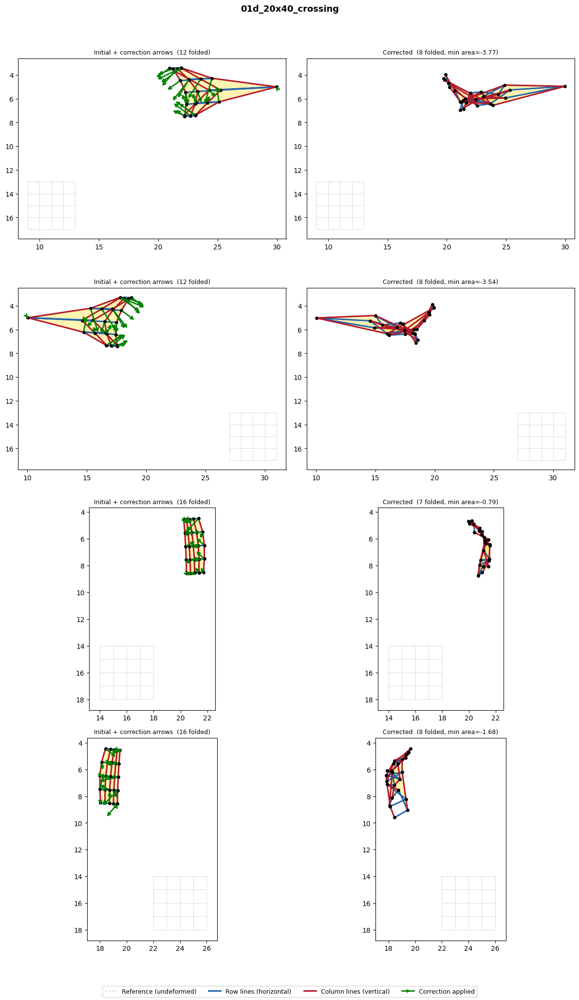

In [7]:
deformation, ms, fs = make_deformation("01d_20x40_crossing")
run_and_show("01d_20x40_crossing", deformation, ms, fs)

## Case 1 - Random DVFs

In [8]:
# Skipped â€” random DVFs take too long
# for key in ["01e_20x20_random_spirals", "01f_20x20_random_seed_42"]:
#     dvf = make_random_dvf(key)
#     run_and_show(key, dvf)

## Case 2 - Real data slices (downscaled)


  02a_64x91  |  64x91  |  neg Jdet: 3  |  below threshold (0.001): 5  |  min Jdet: -0.4948


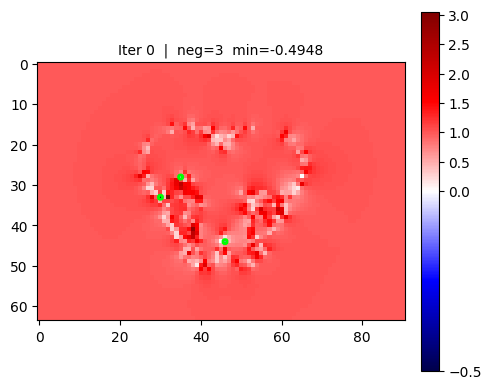

[init] Grid 64x91  |  threshold=0.001  |  method=SLSQP  |  workers=24
[init] Neg-Jdet pixels: 3  |  min Jdet: -0.494795
[iter    1]  parallel  batch=4  neg_pixels=5  windows=3x3,3x4,3x3,3x3
         -> neg_jdet     5  min_jdet -4.604439  L2 19.9705
  [escalate] parallel didn't improve (3->5), global min window -> 5x5


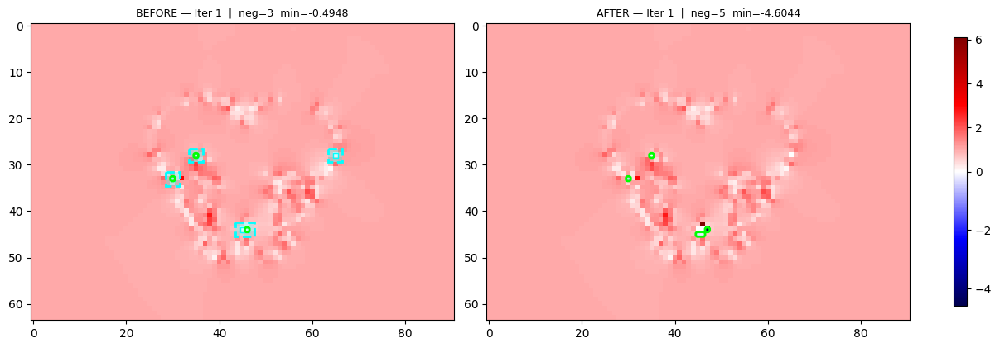

[iter    2]  parallel  batch=4  neg_pixels=6  windows=5x5,5x5,5x5,5x5
         -> neg_jdet     1  min_jdet -0.256325  L2 1.7587


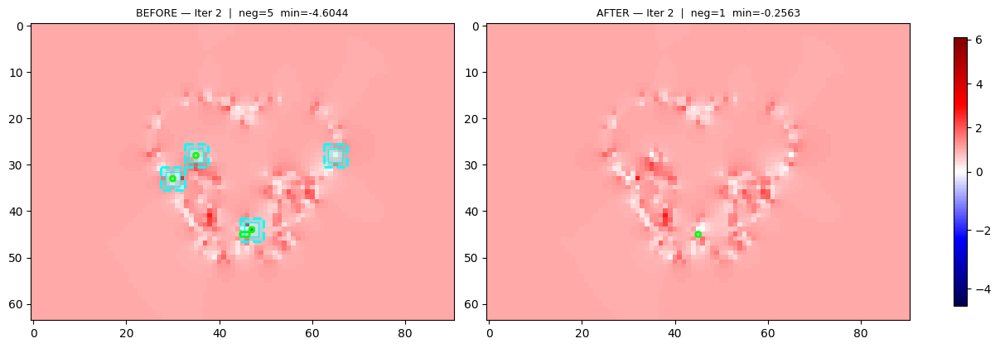

[iter    3]  serial  fix ( 45, 45)  neg_pixels=2
         -> neg_jdet     0  min_jdet +0.001000  L2 0.5629  win 6x5  sub-iters 2


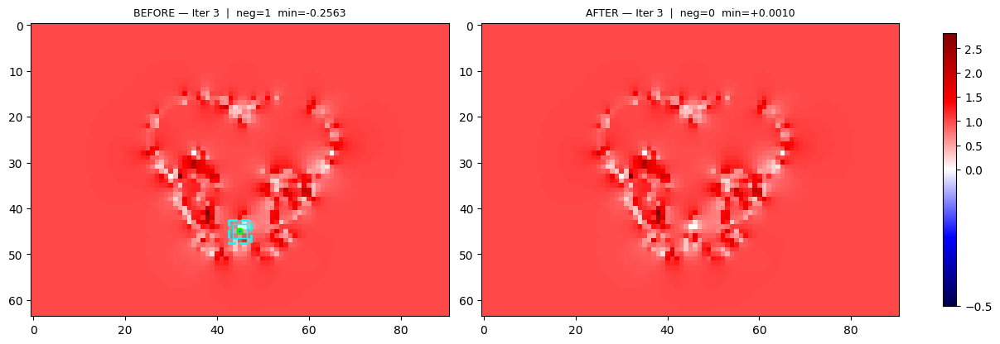

[done] All Jdet > threshold after iter 3

  SUMMARY  (SLSQP — hybrid parallel)
------------------------------------------------------------
  Grid size        : 64 x 91
  Iterations       : 3  (serial=1, parallel=2)
  Neg-Jdet      3 ->     0
  Min Jdet  -0.494795 -> +0.001000
  L2 error         : 0.562908
  Time             : 3.86s
  Time: 3.87s  |  neg Jdet: 3 -> 0  |  below threshold: 5 -> 2  |  min Jdet: -0.4948 -> 0.0010  |  L2: 0.5629
            x-disp min  x-disp max  y-disp min  y-disp max    Jdet min    Jdet max  neg Jdet
--------------------------------------------------------------------------------------------
   initial     -1.9998      1.9998     -1.9998      1.9998     -0.4948      3.0523         3
 corrected     -1.9998      1.9998     -1.9540      1.9998      0.0010      2.8082         0


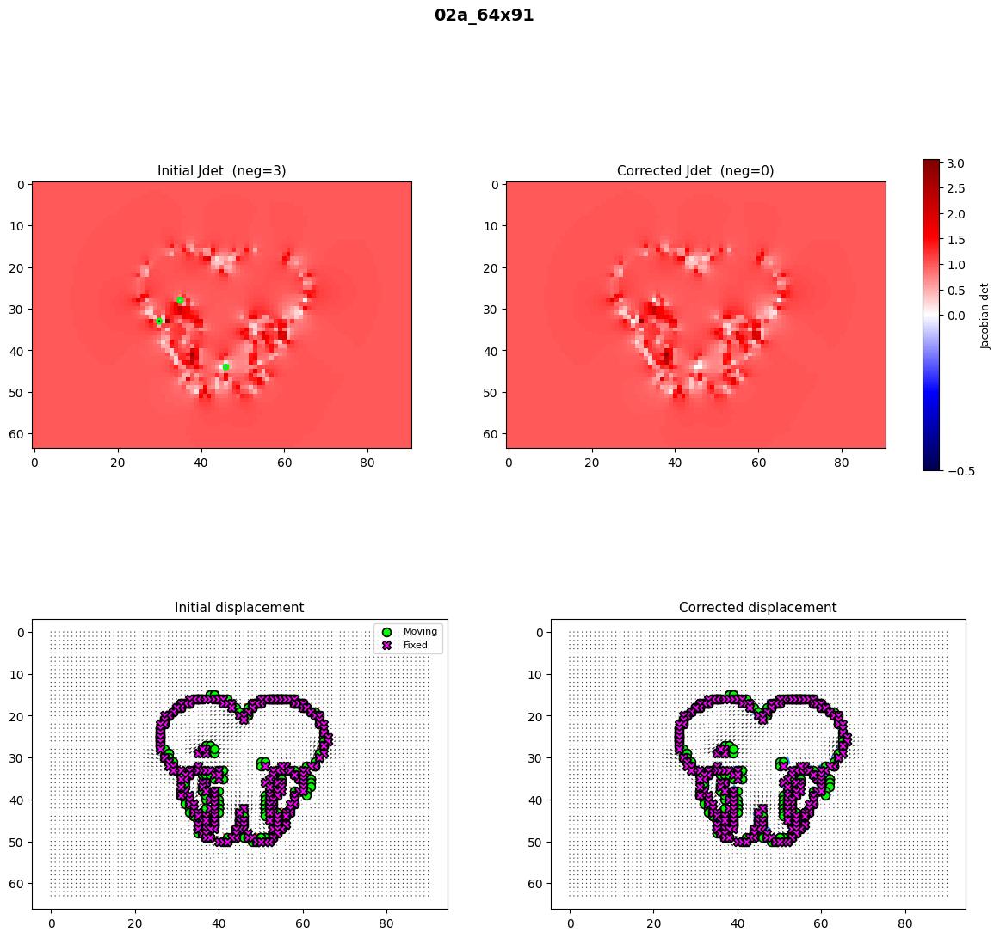

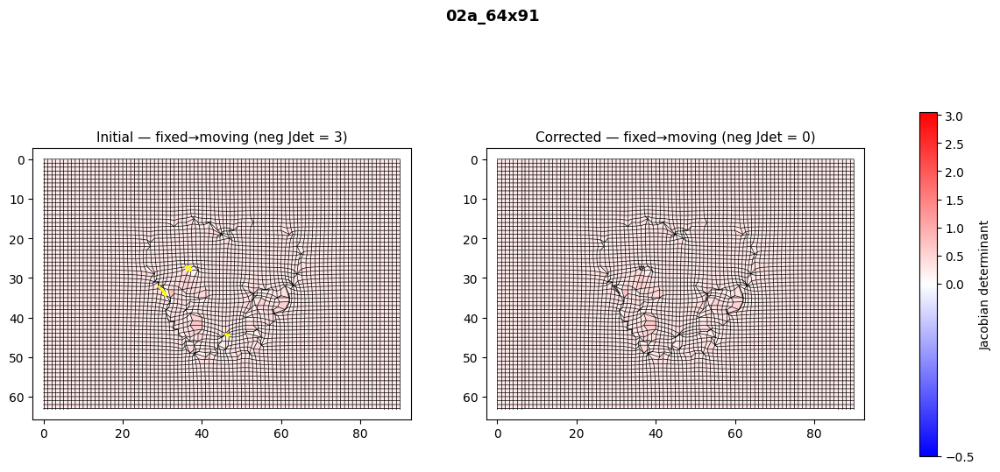

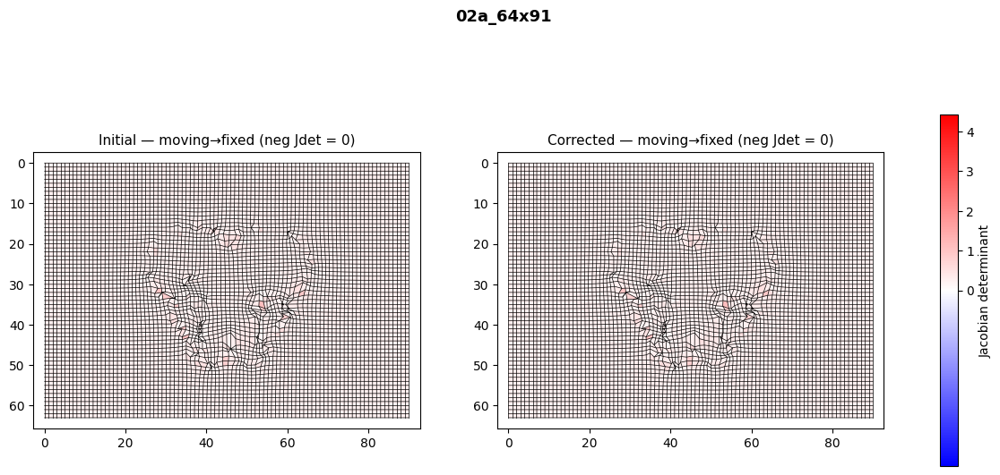

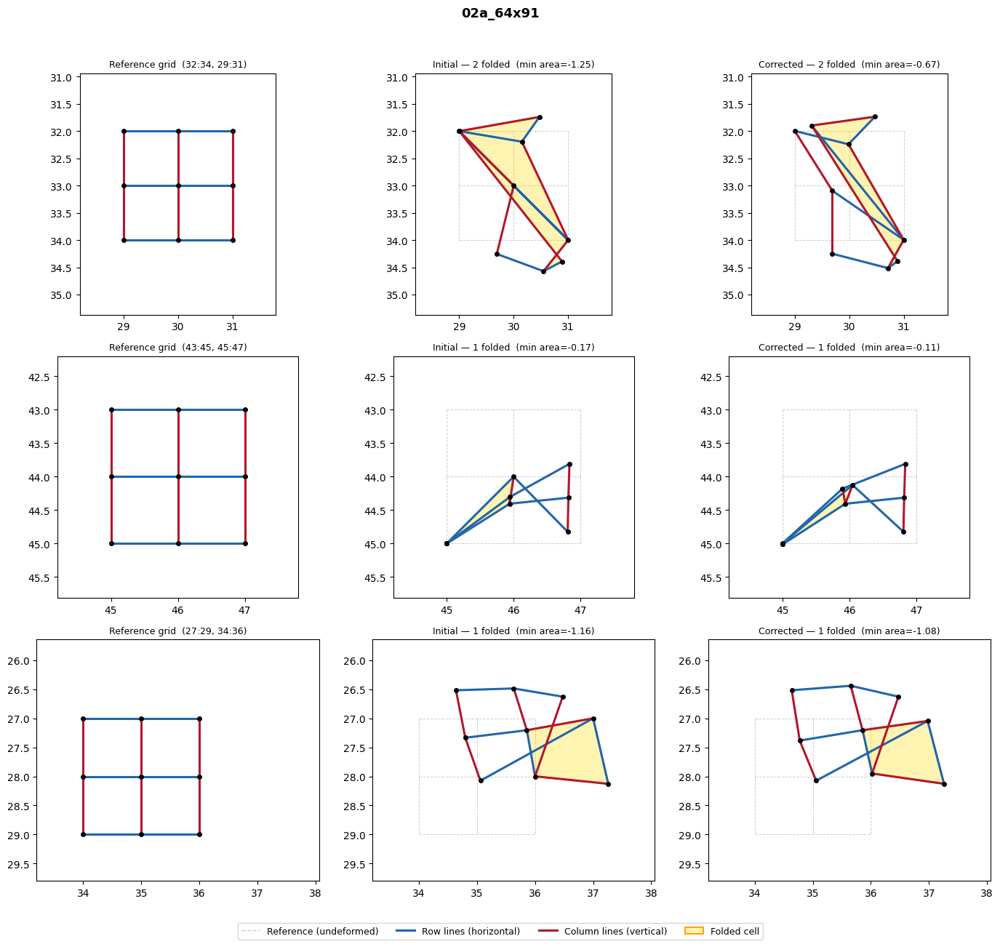

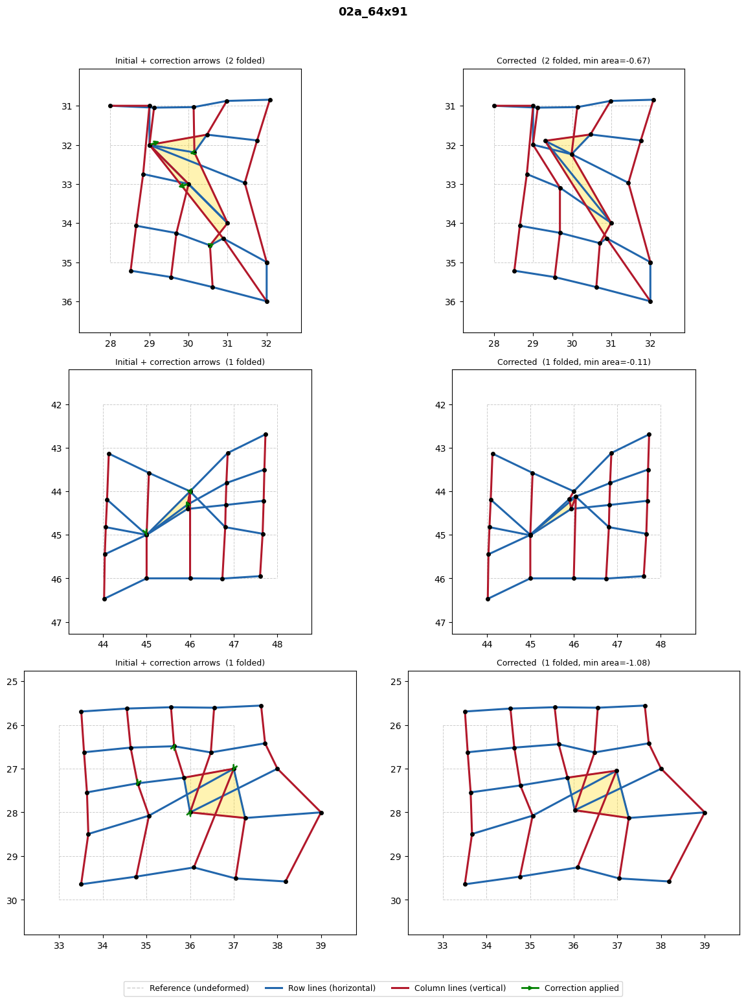


  02b_64x91  |  64x91  |  neg Jdet: 4  |  below threshold (0.001): 5  |  min Jdet: -0.1478


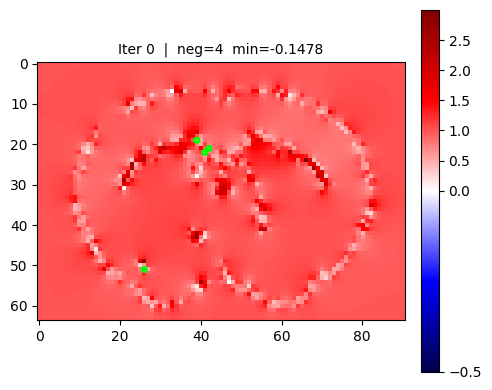

[init] Grid 64x91  |  threshold=0.001  |  method=SLSQP  |  workers=24
[init] Neg-Jdet pixels: 4  |  min Jdet: -0.147787
[iter    1]  parallel  batch=4  neg_pixels=5  windows=3x3,3x3,3x3,3x3
         -> neg_jdet     4  min_jdet -0.147787  L2 0.0000
  [escalate] parallel didn't improve (4->4), global min window -> 5x5


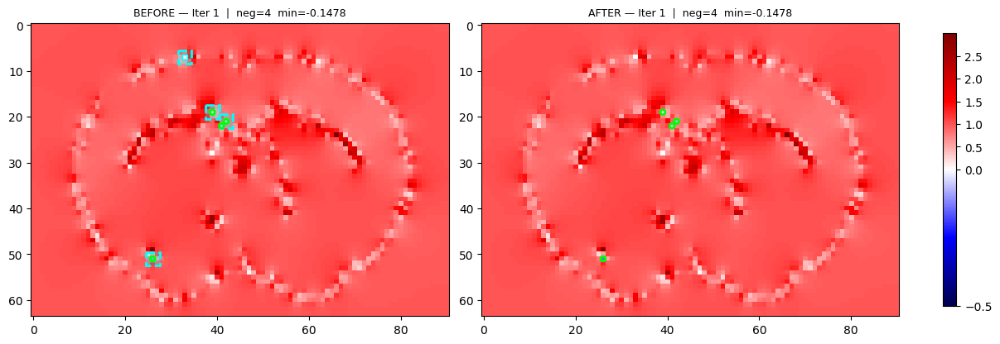

[iter    2]  parallel  batch=3  neg_pixels=5  windows=5x5,5x5,5x5
         -> neg_jdet     1  min_jdet -0.000091  L2 0.2331


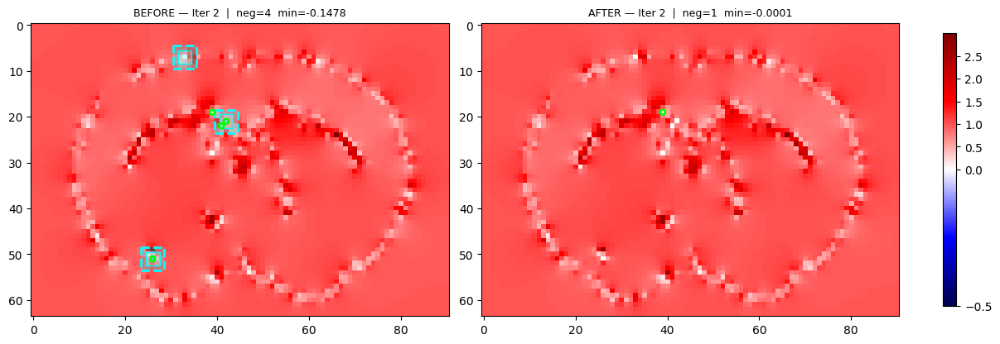

[iter    3]  serial  fix ( 19, 39)  neg_pixels=1
         -> neg_jdet     0  min_jdet +0.001000  L2 0.2331  win 5x5  sub-iters 2


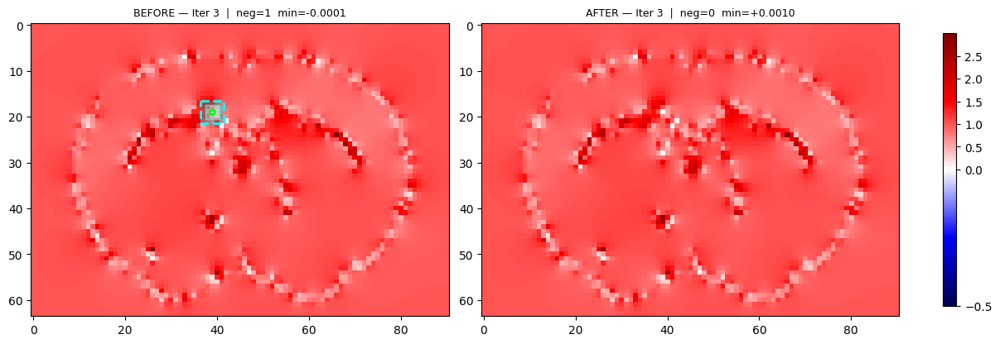

[done] All Jdet > threshold after iter 3

  SUMMARY  (SLSQP — hybrid parallel)
------------------------------------------------------------
  Grid size        : 64 x 91
  Iterations       : 3  (serial=1, parallel=2)
  Neg-Jdet      4 ->     0
  Min Jdet  -0.147787 -> +0.001000
  L2 error         : 0.233077
  Time             : 6.71s
  Time: 6.71s  |  neg Jdet: 4 -> 0  |  below threshold: 5 -> 3  |  min Jdet: -0.1478 -> 0.0010  |  L2: 0.2331
            x-disp min  x-disp max  y-disp min  y-disp max    Jdet min    Jdet max  neg Jdet
--------------------------------------------------------------------------------------------
   initial     -1.9998      1.9998     -2.0002      3.0002     -0.1478      2.9999         4
 corrected     -1.9998      1.9999     -2.0002      2.8732      0.0010      2.9999         0


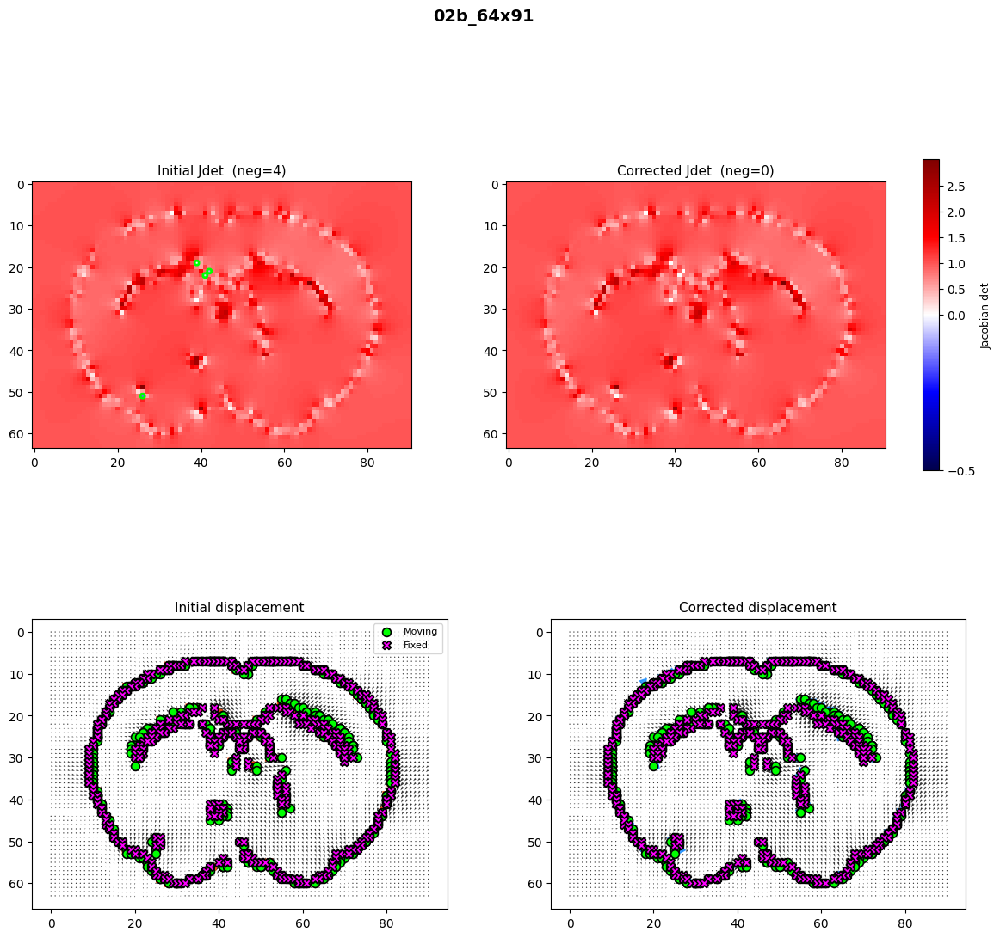

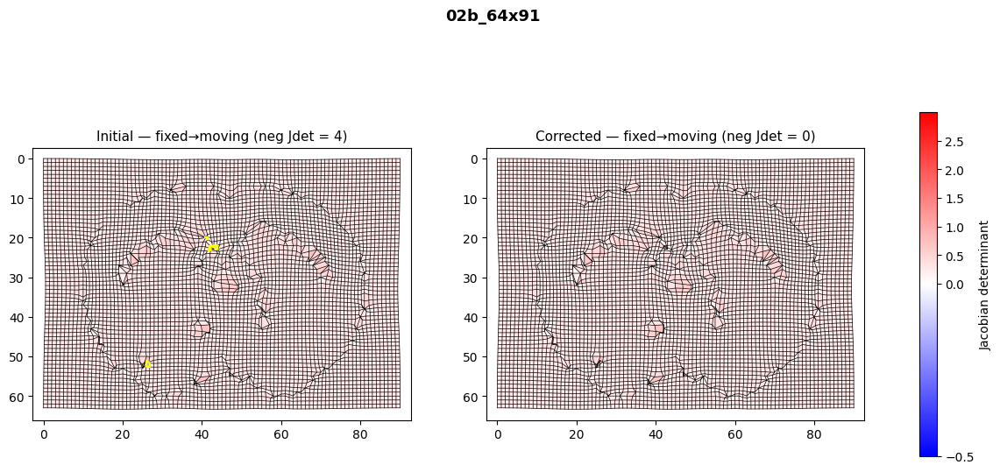

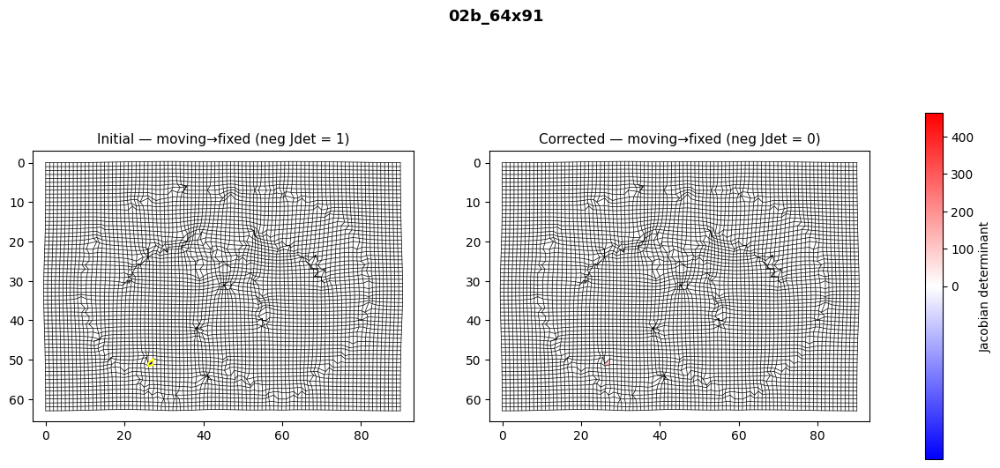

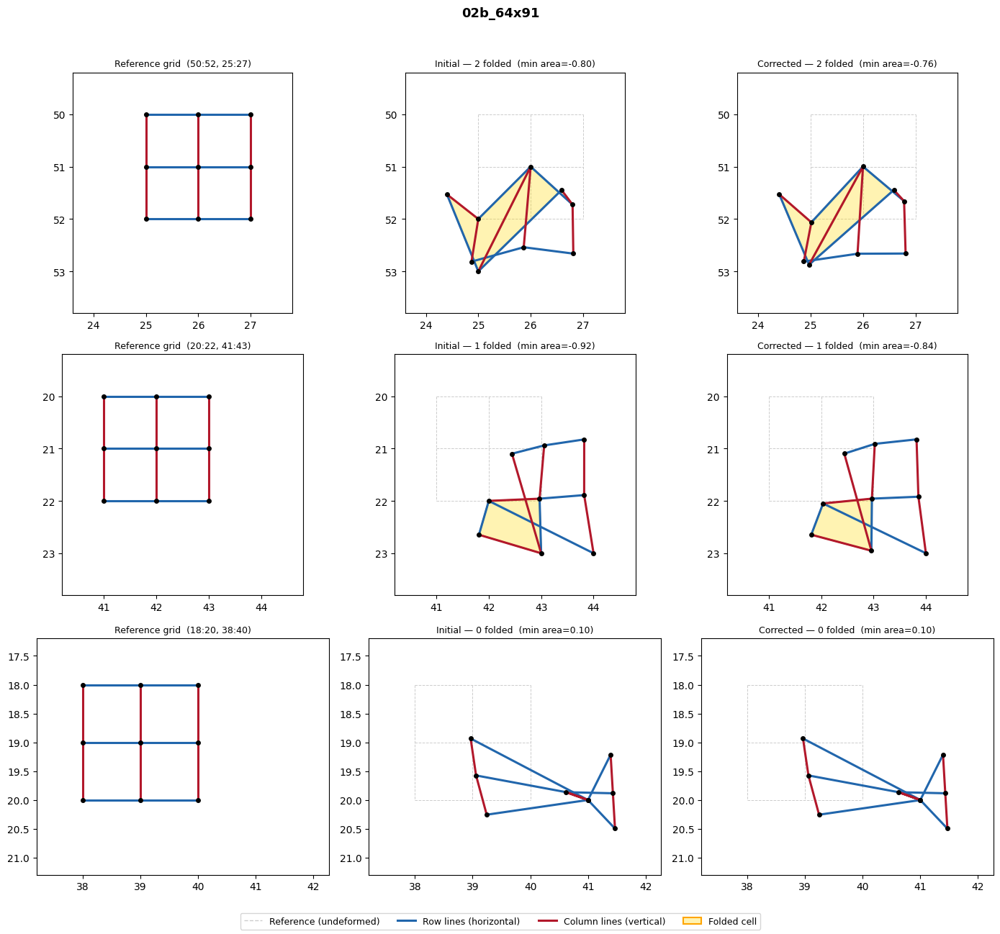

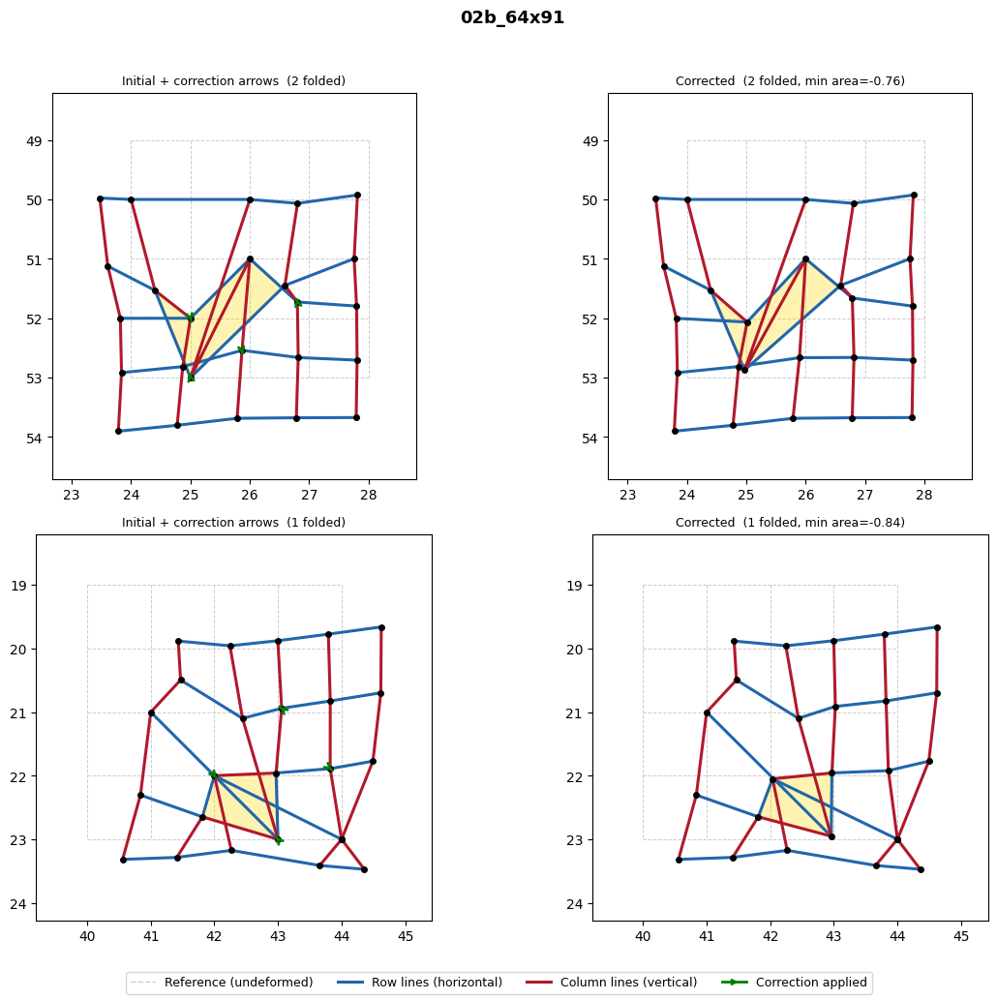


  02c_64x91  |  64x91  |  neg Jdet: 3  |  below threshold (0.001): 5  |  min Jdet: -0.4660


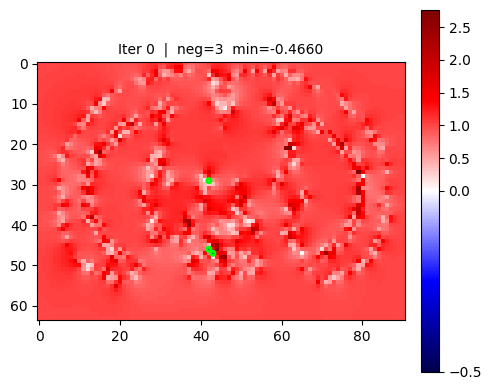

[init] Grid 64x91  |  threshold=0.001  |  method=SLSQP  |  workers=24
[init] Neg-Jdet pixels: 3  |  min Jdet: -0.466025
[iter    1]  parallel  batch=4  neg_pixels=5  windows=3x3,3x3,3x3,3x3
         -> neg_jdet     3  min_jdet -0.466025  L2 0.0000
  [escalate] parallel didn't improve (3->3), global min window -> 5x5


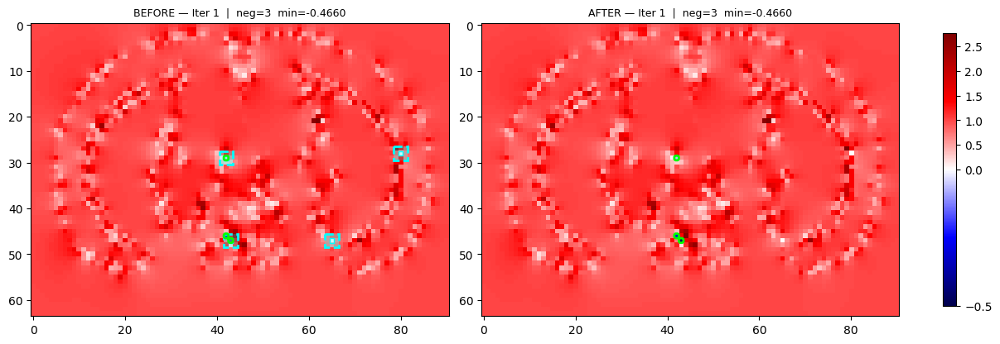

[iter    2]  parallel  batch=4  neg_pixels=5  windows=5x5,5x5,5x5,5x5
         -> neg_jdet     0  min_jdet +0.001000  L2 0.6885


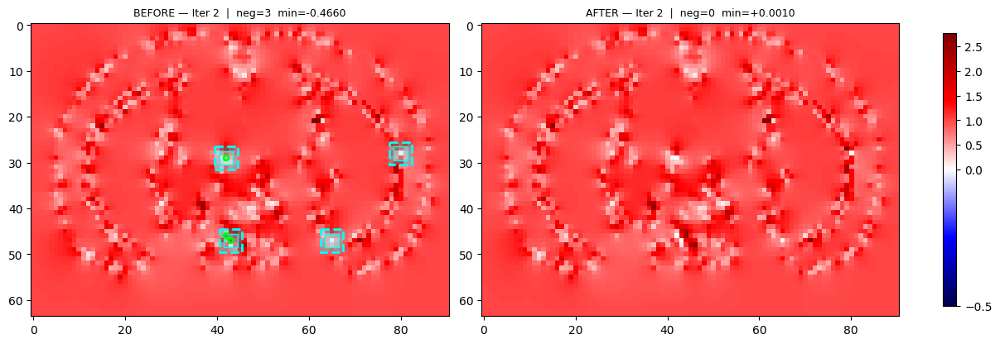

[done] All Jdet > threshold after iter 2

  SUMMARY  (SLSQP — hybrid parallel)
------------------------------------------------------------
  Grid size        : 64 x 91
  Iterations       : 2  (serial=0, parallel=2)
  Neg-Jdet      3 ->     0
  Min Jdet  -0.466025 -> +0.001000
  L2 error         : 0.688520
  Time             : 4.08s
  Time: 4.08s  |  neg Jdet: 3 -> 0  |  below threshold: 5 -> 3  |  min Jdet: -0.4660 -> 0.0010  |  L2: 0.6885
            x-disp min  x-disp max  y-disp min  y-disp max    Jdet min    Jdet max  neg Jdet
--------------------------------------------------------------------------------------------
   initial     -2.9997      1.9998     -1.9998      1.9998     -0.4660      2.7644         3
 corrected     -2.4961      1.9998     -1.9998      1.9998      0.0010      2.7644         0


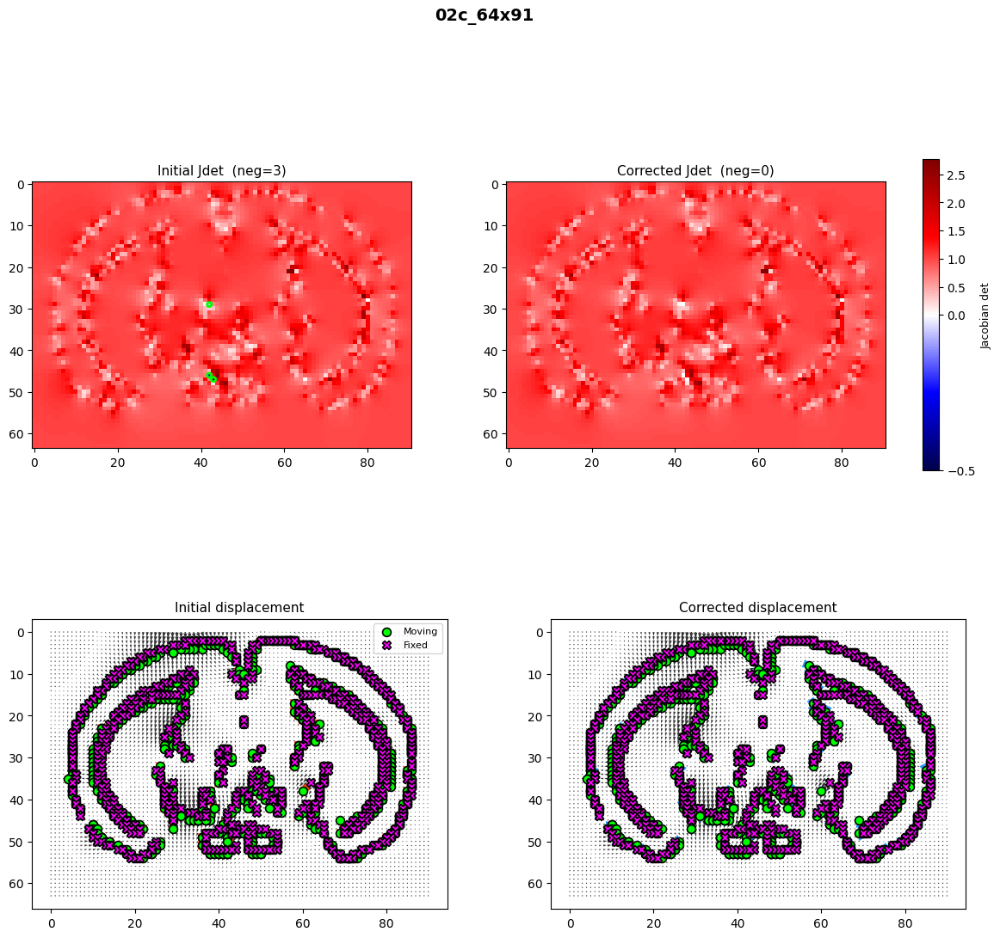

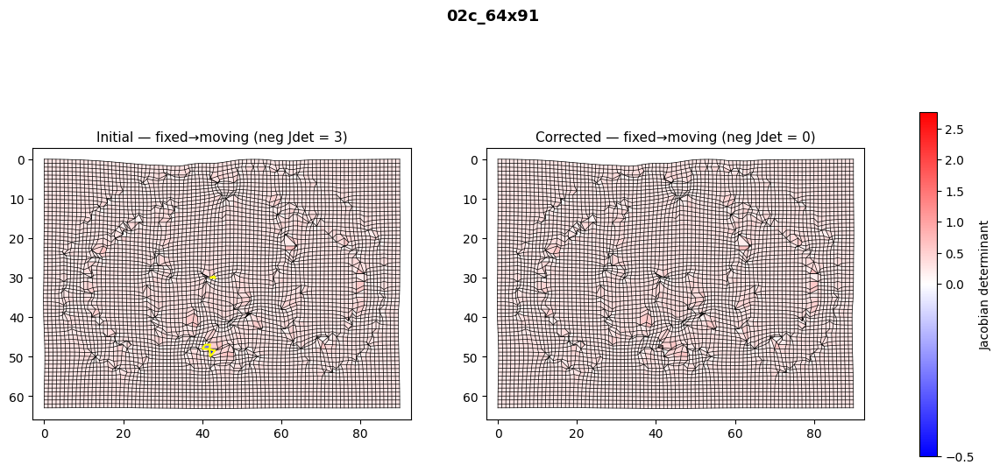

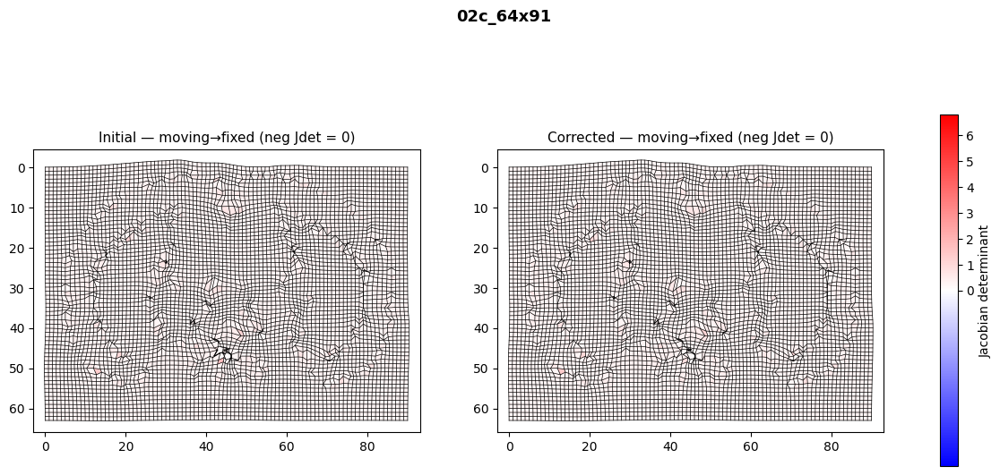

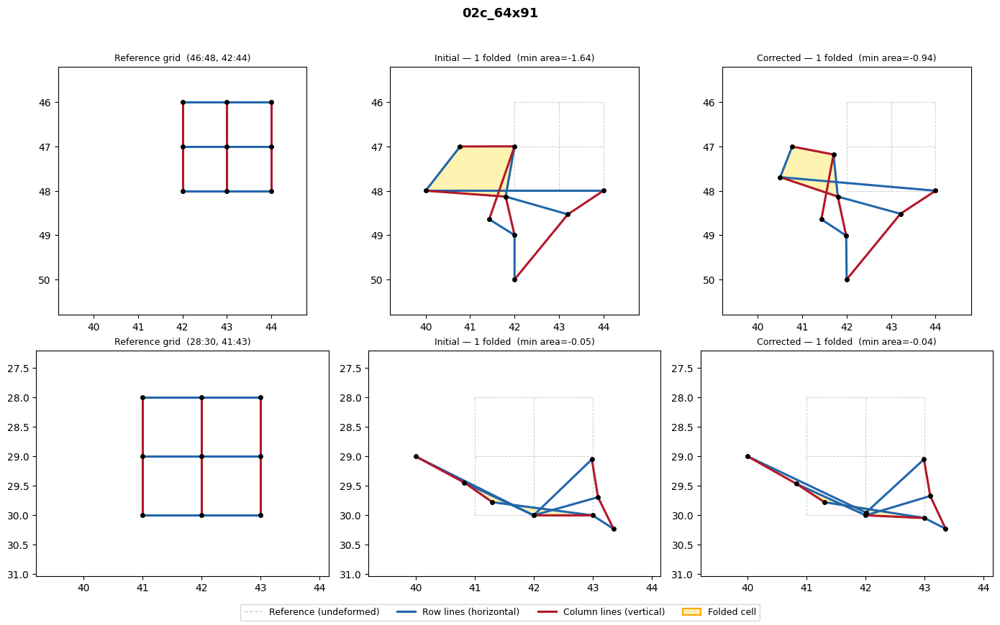

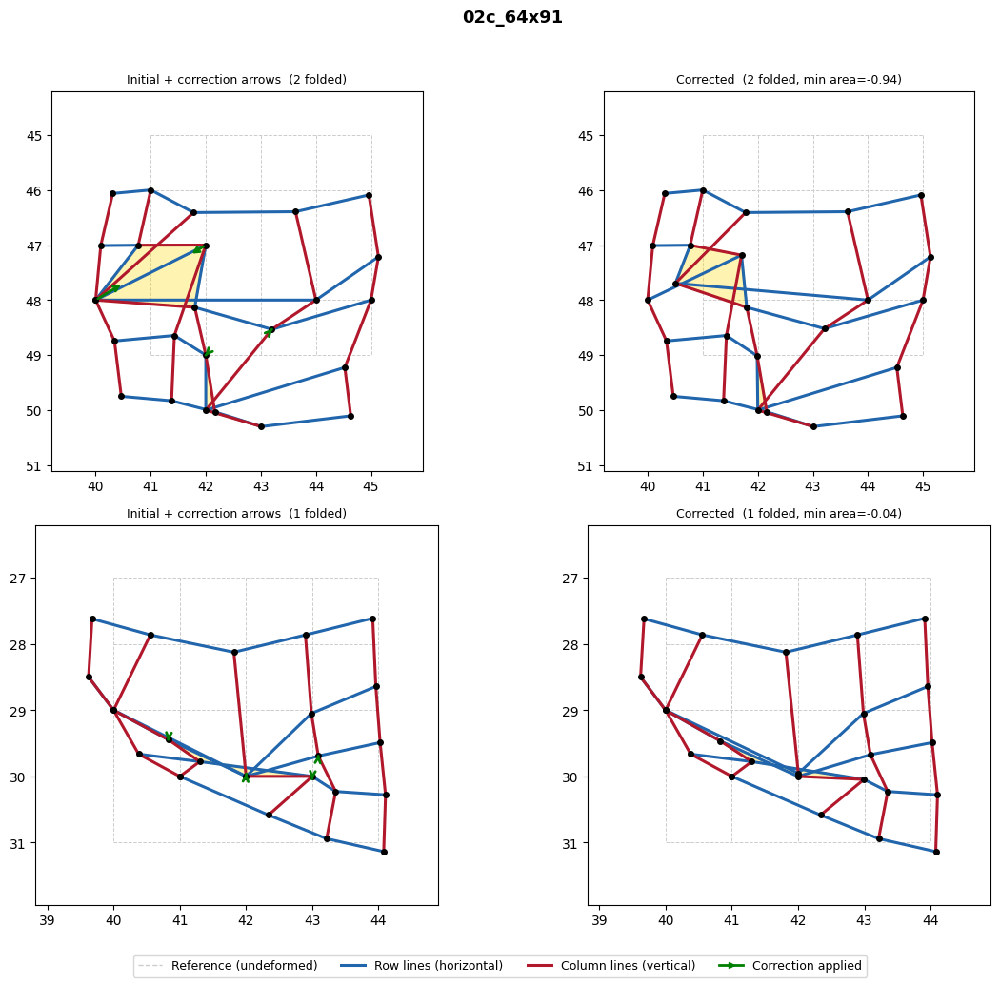


  02d_64x91  |  64x91  |  neg Jdet: 3  |  below threshold (0.001): 8  |  min Jdet: -0.5775


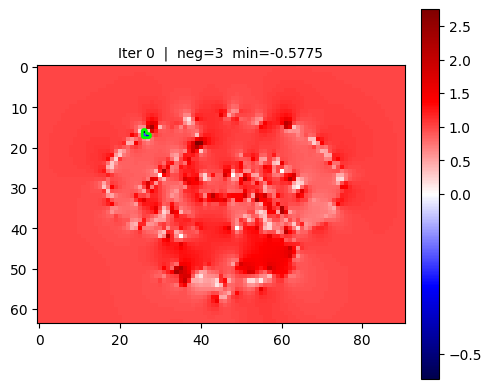

[init] Grid 64x91  |  threshold=0.001  |  method=SLSQP  |  workers=24
[init] Neg-Jdet pixels: 3  |  min Jdet: -0.577451
[iter    1]  parallel  batch=6  neg_pixels=8  windows=4x4,3x3,3x3,3x3,3x3,3x3
         -> neg_jdet     0  min_jdet +0.000080  L2 1.3138


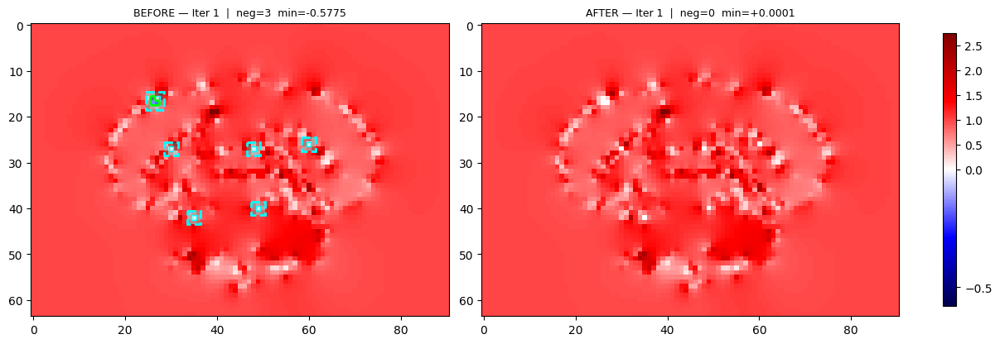

[iter    2]  parallel  batch=5  neg_pixels=5  windows=5x5,5x5,5x5,5x5,5x5
         -> neg_jdet     0  min_jdet +0.001000  L2 1.3138
  [escalate] parallel didn't improve (0->0), global min window -> 5x5


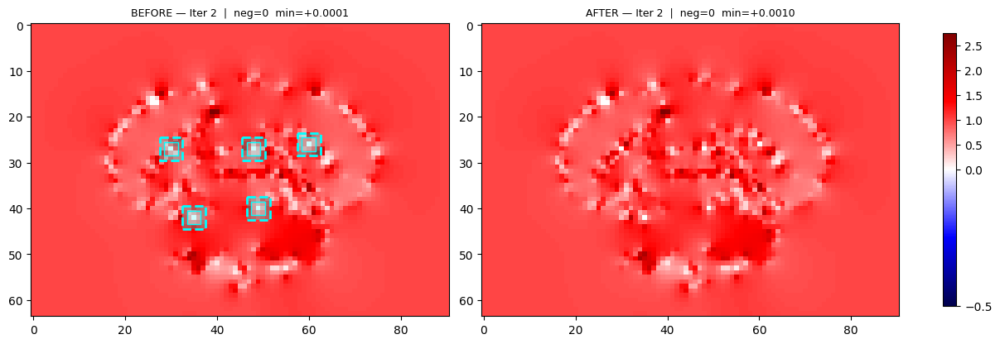

[done] All Jdet > threshold after iter 2

  SUMMARY  (SLSQP — hybrid parallel)
------------------------------------------------------------
  Grid size        : 64 x 91
  Iterations       : 2  (serial=0, parallel=2)
  Neg-Jdet      3 ->     0
  Min Jdet  -0.577451 -> +0.001000
  L2 error         : 1.313811
  Time             : 4.32s
  Time: 4.32s  |  neg Jdet: 3 -> 0  |  below threshold: 8 -> 2  |  min Jdet: -0.5775 -> 0.0010  |  L2: 1.3138
            x-disp min  x-disp max  y-disp min  y-disp max    Jdet min    Jdet max  neg Jdet
--------------------------------------------------------------------------------------------
   initial     -2.9997      1.9998     -1.9998      1.9998     -0.5775      2.7466         3
 corrected     -2.1808      1.9998     -1.9998      1.9998      0.0010      2.7466         0


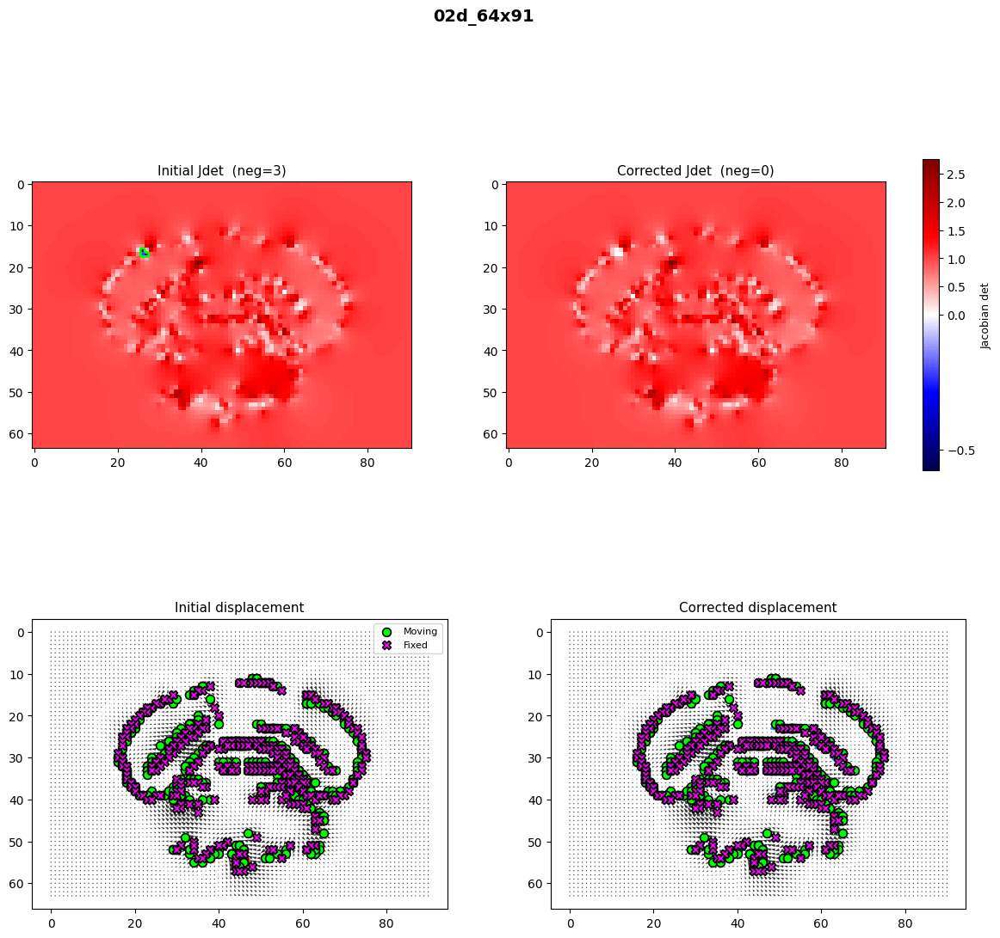

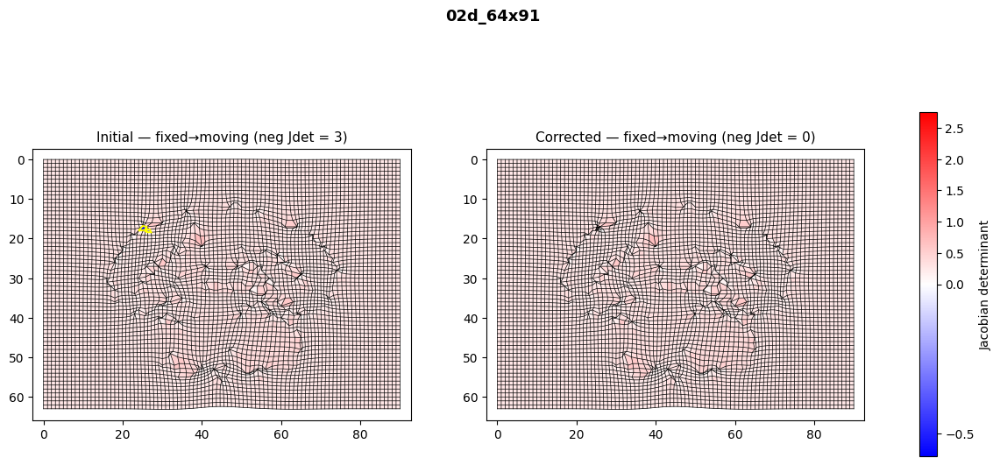

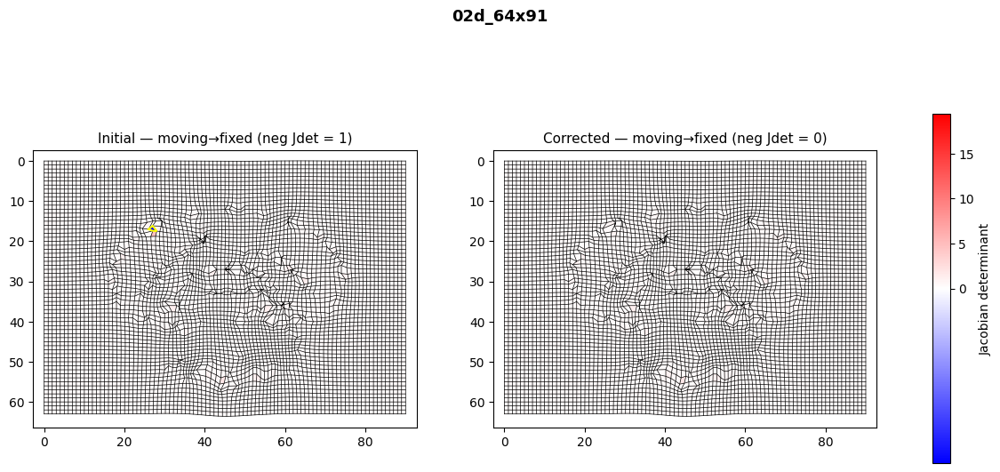

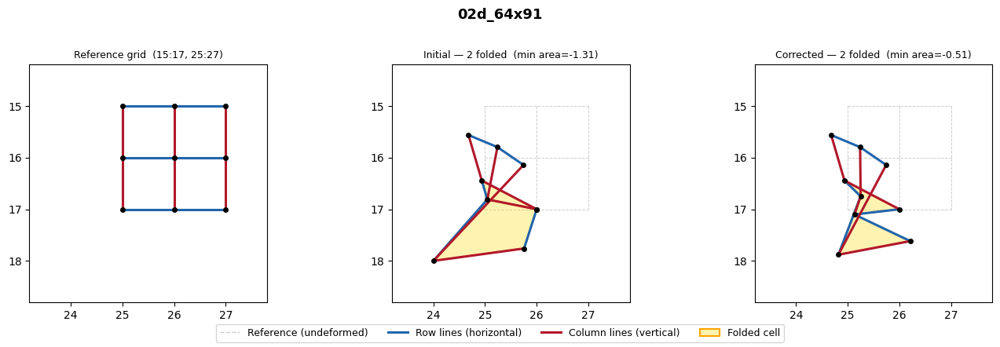

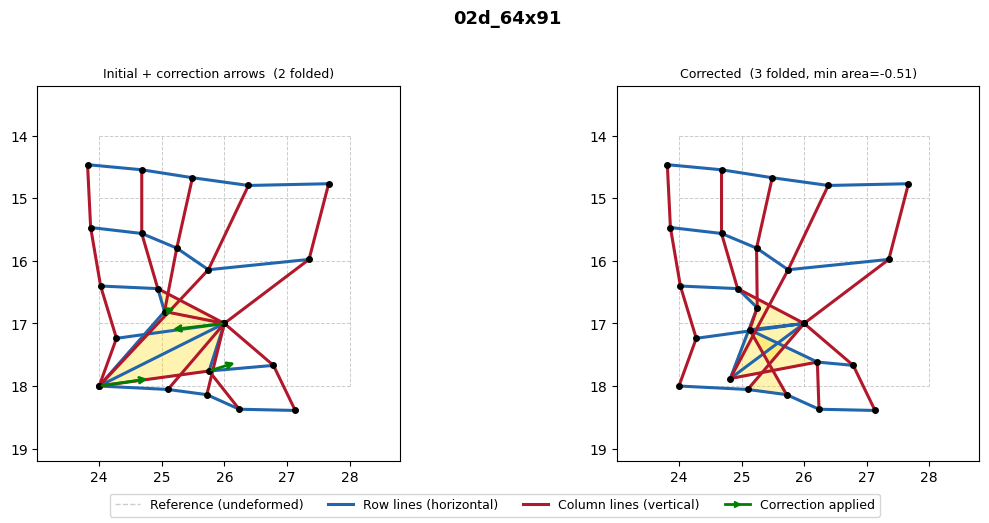

In [9]:
for key, cfg in REAL_DATA_SLICES.items():
    if cfg["scale_factor"] < 1.0:  # only downscaled for speed
        deformation, ms, fs = load_slice(cfg["slice_idx"], scale_factor=cfg["scale_factor"])
        run_and_show(key, deformation, ms, fs)

## Case 3 â€” Additional synthetic grids


  03a_10x10_opposite  |  10x10  |  neg Jdet: 14  |  below threshold (0.001): 14  |  min Jdet: -1.1289


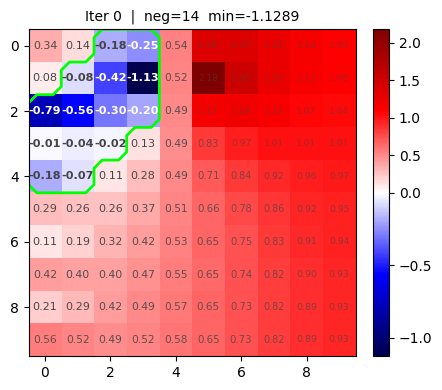

[init] Grid 10x10  |  threshold=0.001  |  method=SLSQP  |  workers=24
[init] Neg-Jdet pixels: 14  |  min Jdet: -1.128860
[iter    1]  serial  fix (  1,  3)  neg_pixels=9
         -> neg_jdet     1  min_jdet -0.393451  L2 1.9605  win 6x5  sub-iters 1


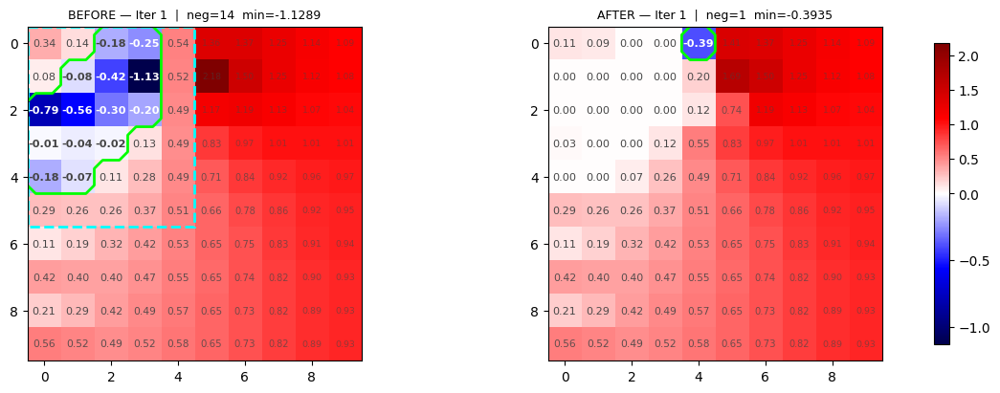

[done] All Jdet > threshold after iter 1

  SUMMARY  (SLSQP — hybrid parallel)
------------------------------------------------------------
  Grid size        : 10 x 10
  Iterations       : 1  (serial=1, parallel=0)
  Neg-Jdet     14 ->     1
  Min Jdet  -1.128860 -> -0.393451
  L2 error         : 1.960542
  Time             : 0.50s
  Time: 0.51s  |  neg Jdet: 14 -> 1  |  below threshold: 14 -> 3  |  min Jdet: -1.1289 -> -0.3935  |  L2: 1.9605
            x-disp min  x-disp max  y-disp min  y-disp max    Jdet min    Jdet max  neg Jdet
--------------------------------------------------------------------------------------------
   initial     -3.9996      3.9996      0.0000      0.0000     -1.1289      2.1763        14
 corrected     -3.3617      3.9996     -0.8583      0.6579     -0.3935      1.6888         1


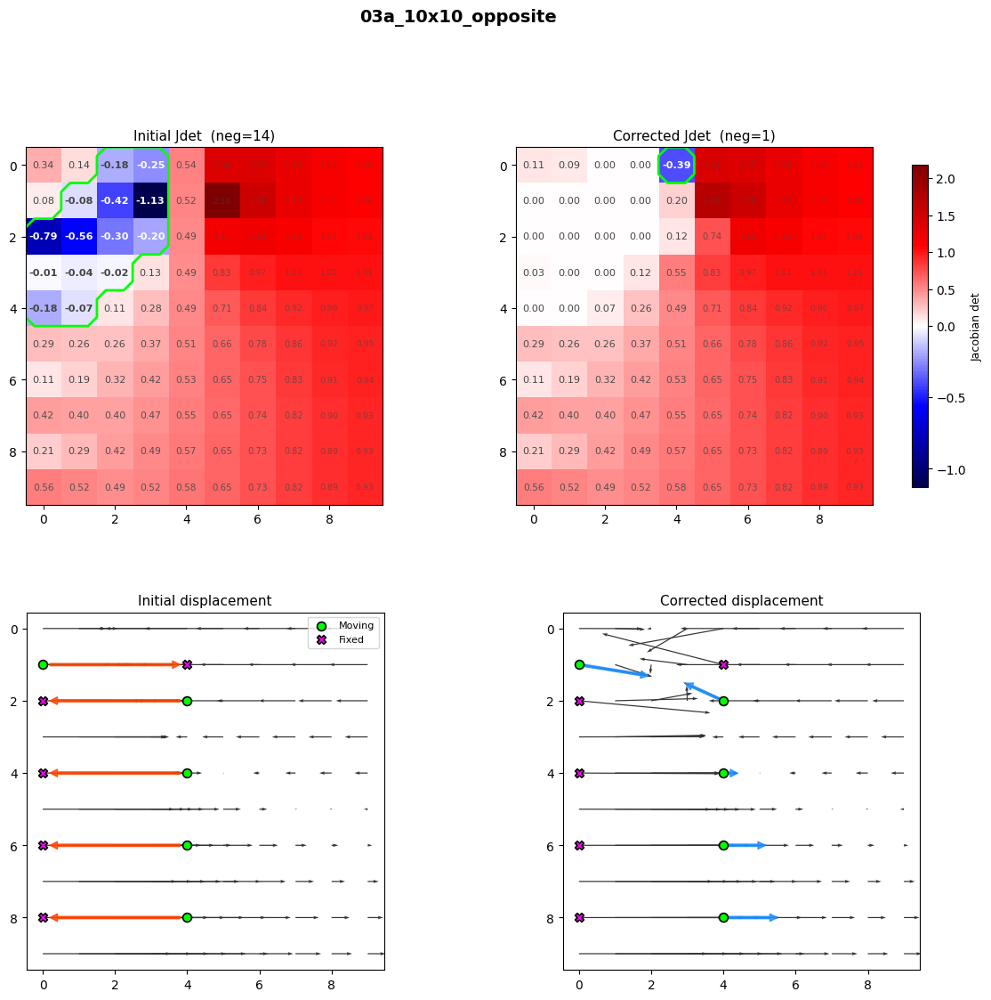

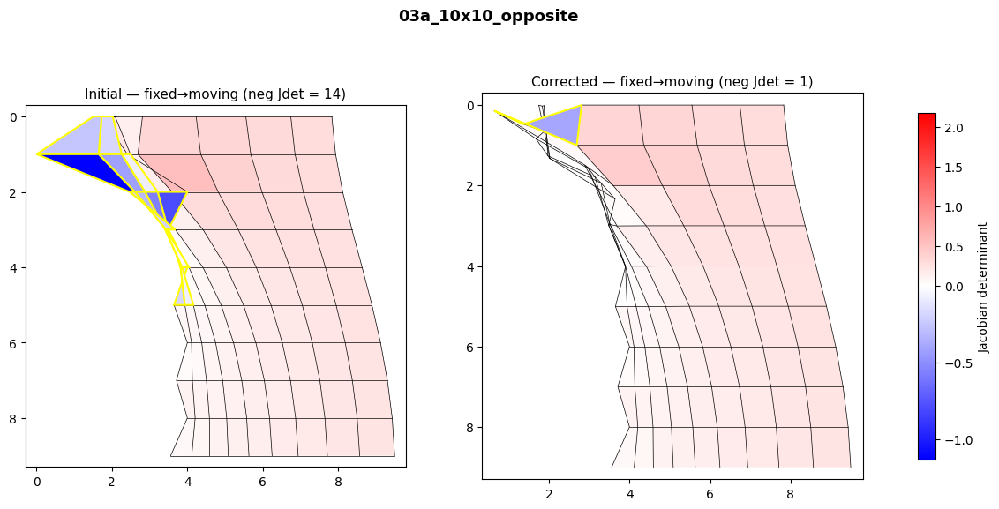

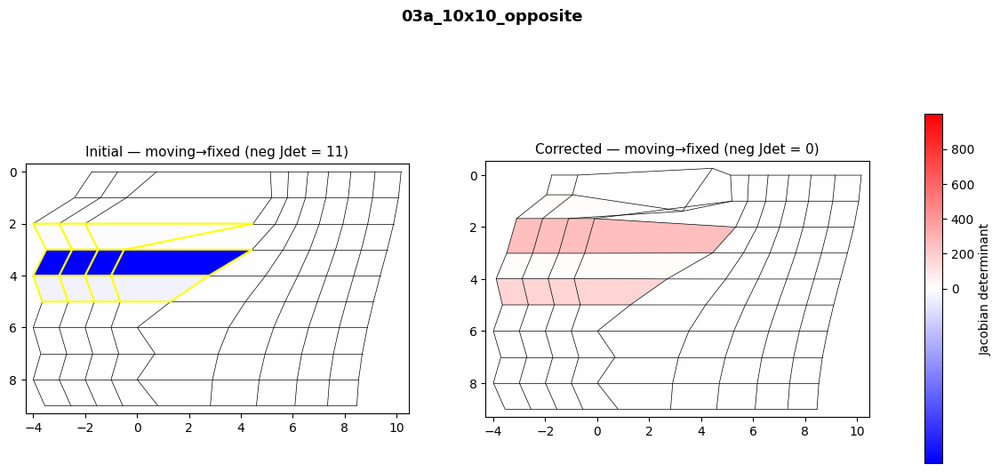

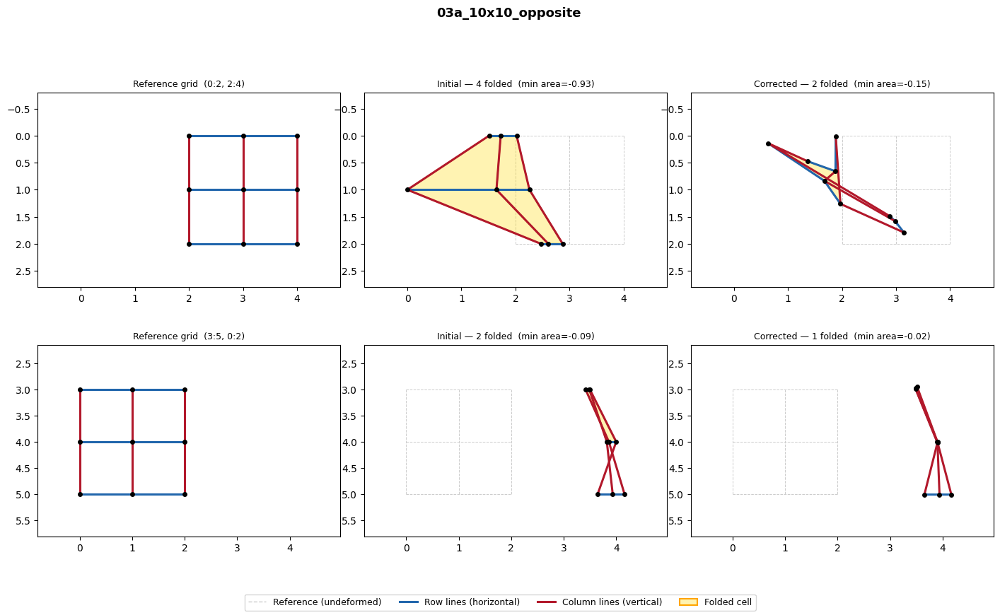

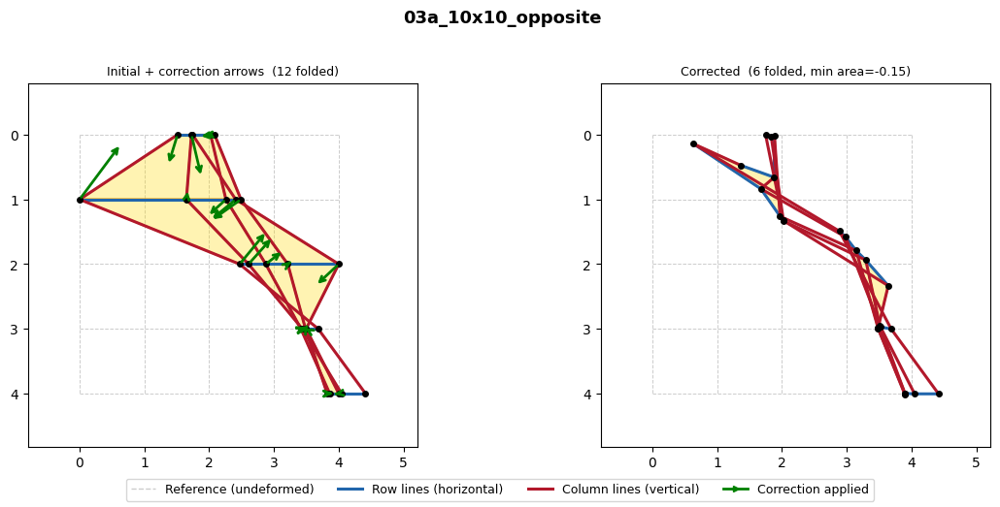

In [10]:
deformation, ms, fs = make_deformation("03a_10x10_opposite")
run_and_show("03a_10x10_opposite", deformation, ms, fs)


  03b_10x10_crossing  |  10x10  |  neg Jdet: 18  |  below threshold (0.001): 18  |  min Jdet: -1.0478


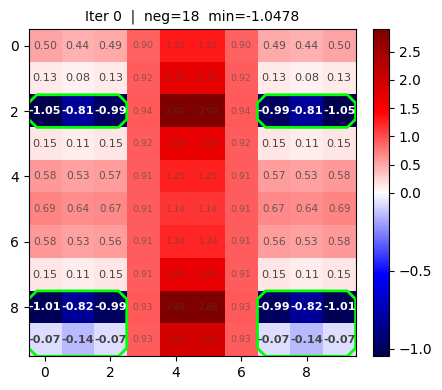

[init] Grid 10x10  |  threshold=0.001  |  method=SLSQP  |  workers=24
[init] Neg-Jdet pixels: 18  |  min Jdet: -1.047820
[iter    1]  parallel  batch=4  neg_pixels=8  windows=3x4,3x4,3x4,3x4
         -> neg_jdet     2  min_jdet -0.008137  L2 4.3336


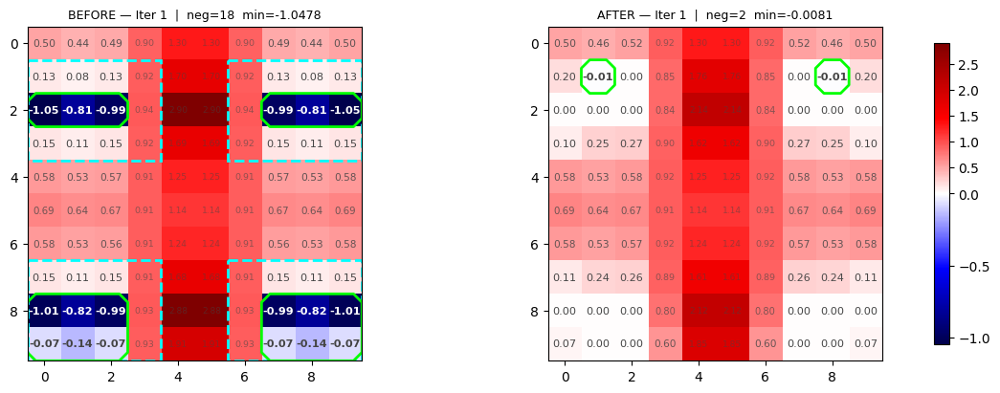

[iter    2]  parallel  batch=2  neg_pixels=4  windows=3x4,3x4
         -> neg_jdet     6  min_jdet -0.870045  L2 3.3773
  [escalate] parallel didn't improve (2->6), global min window -> 5x5


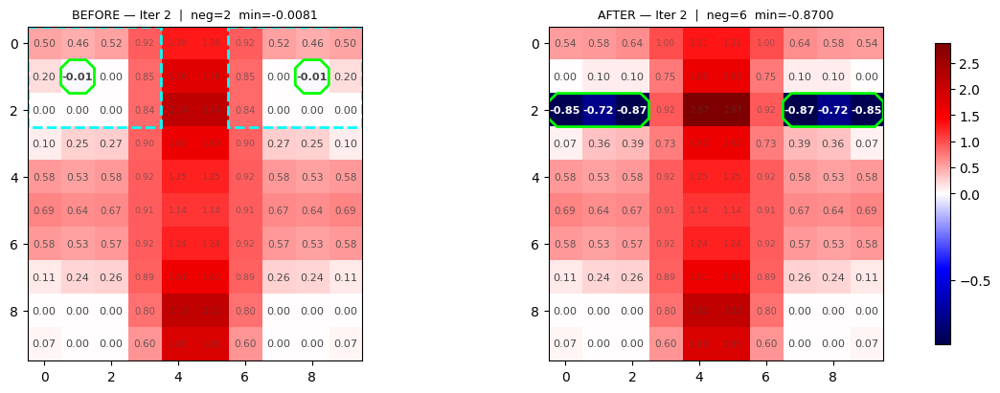

[iter    3]  parallel  batch=2  neg_pixels=4  windows=5x5,5x5
         -> neg_jdet     0  min_jdet +0.001000  L2 4.0248


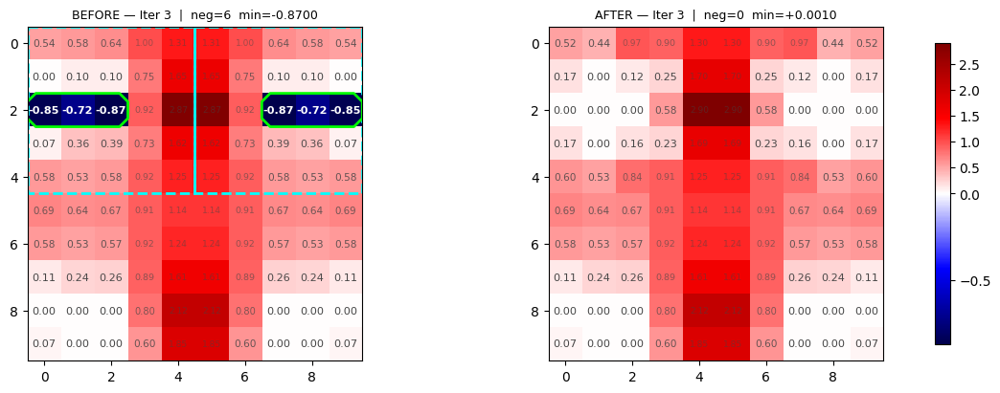

[done] All Jdet > threshold after iter 3

  SUMMARY  (SLSQP — hybrid parallel)
------------------------------------------------------------
  Grid size        : 10 x 10
  Iterations       : 3  (serial=0, parallel=3)
  Neg-Jdet     18 ->     0
  Min Jdet  -1.047820 -> +0.001000
  L2 error         : 4.024792
  Time             : 2.02s
  Time: 2.02s  |  neg Jdet: 18 -> 0  |  below threshold: 18 -> 4  |  min Jdet: -1.0478 -> 0.0010  |  L2: 4.0248
            x-disp min  x-disp max  y-disp min  y-disp max    Jdet min    Jdet max  neg Jdet
--------------------------------------------------------------------------------------------
   initial     -2.9997      2.9997     -2.0214     -1.9882     -1.0478      2.8974        18
 corrected     -3.0002      3.0002     -3.0054     -1.0042      0.0010      2.8977         0


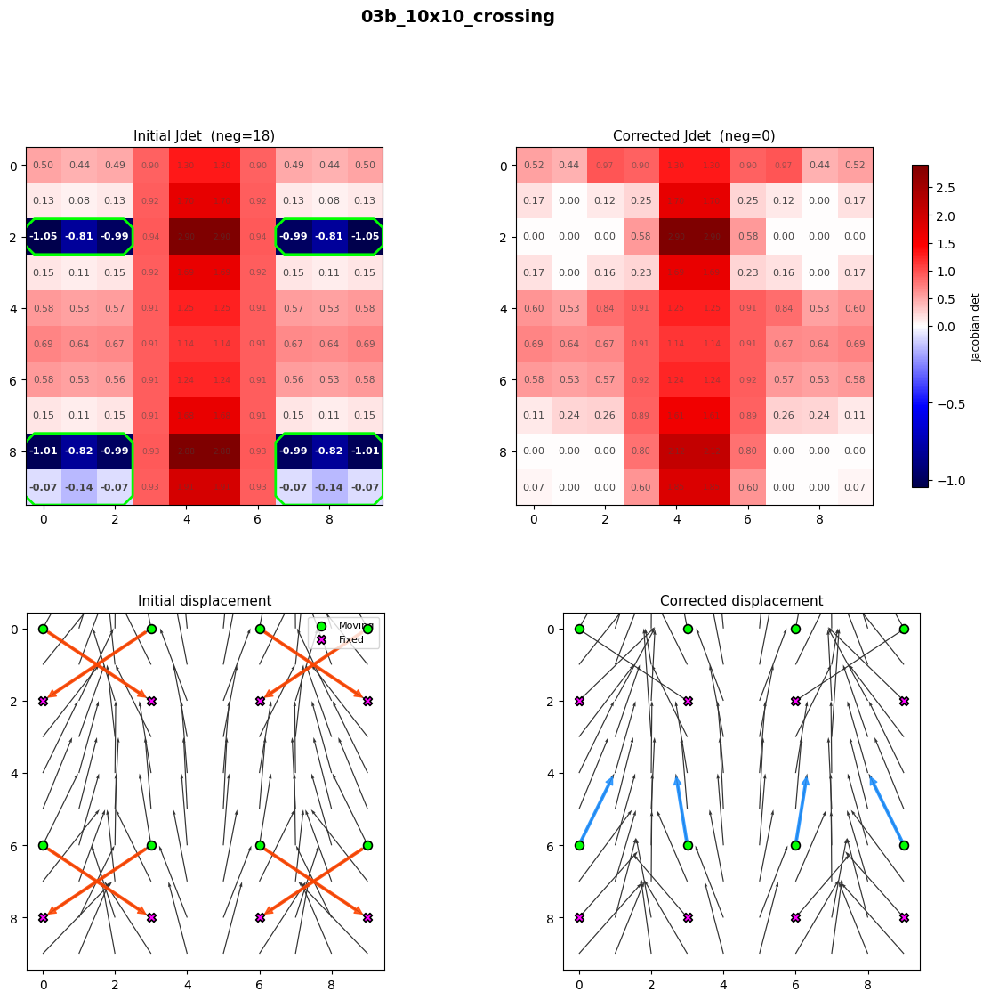

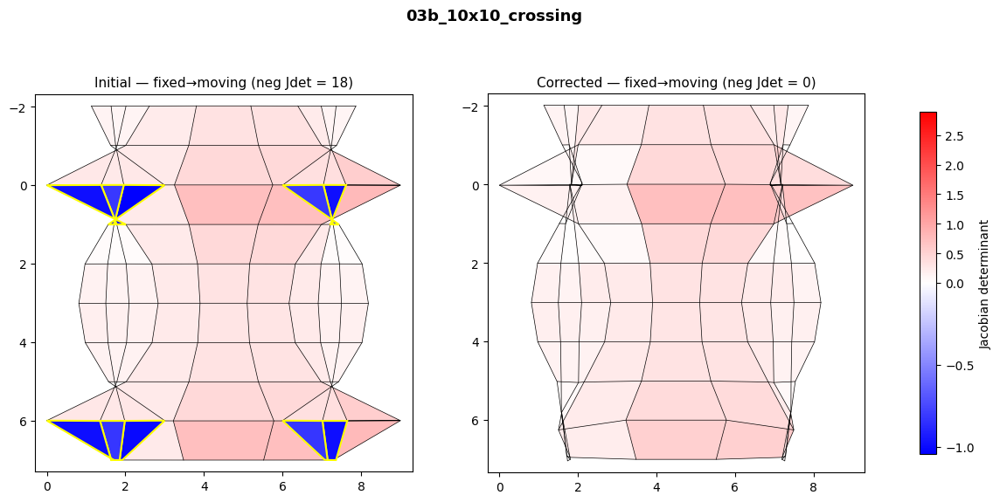

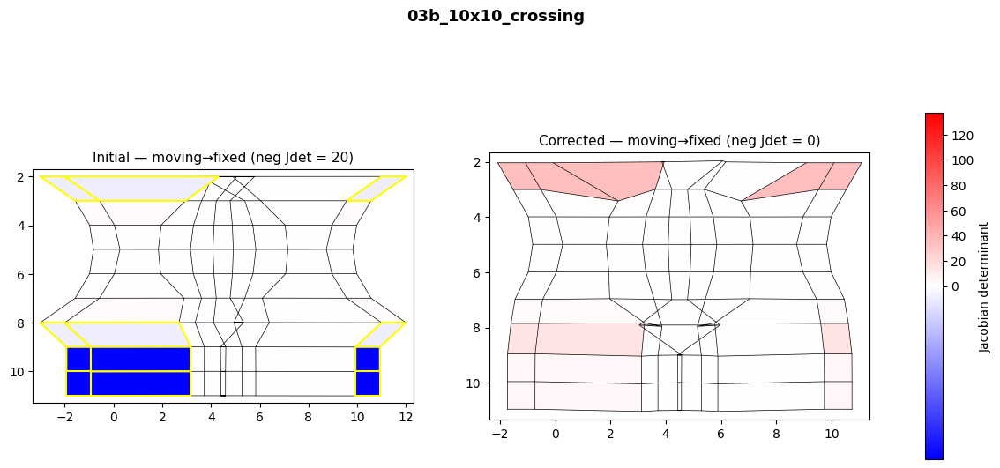

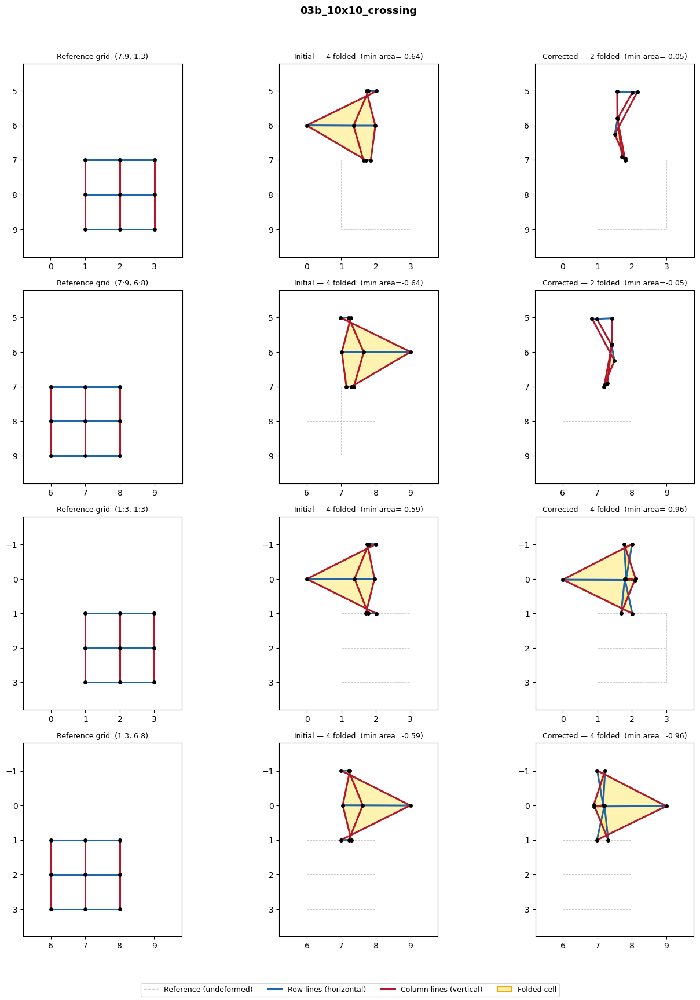

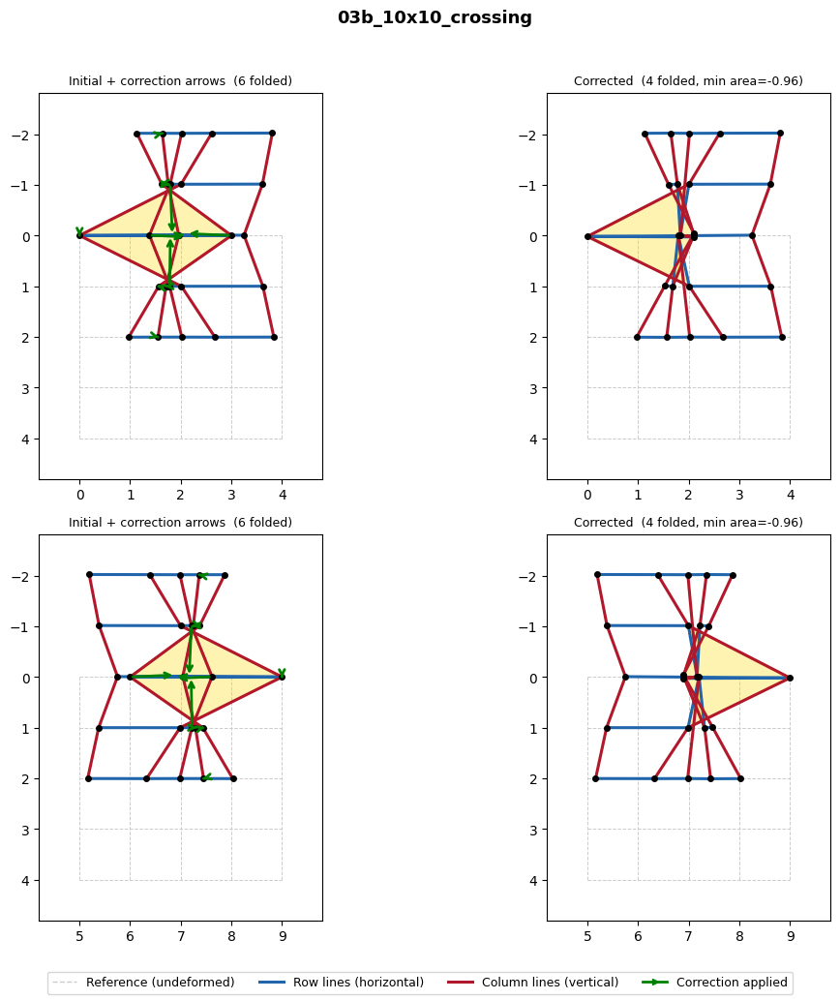

In [11]:
deformation, ms, fs = make_deformation("03b_10x10_crossing")
run_and_show("03b_10x10_crossing", deformation, ms, fs)


  03c_20x20_opposite  |  20x20  |  neg Jdet: 36  |  below threshold (0.001): 36  |  min Jdet: -1.4149


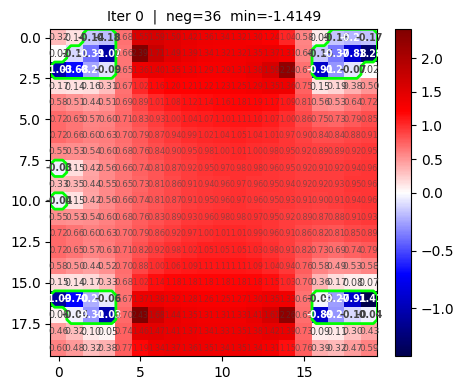

[init] Grid 20x20  |  threshold=0.001  |  method=SLSQP  |  workers=24
[init] Neg-Jdet pixels: 36  |  min Jdet: -1.414921
[iter    1]  parallel  batch=4  neg_pixels=24  windows=4x5,4x5,4x5,4x5
         -> neg_jdet     3  min_jdet -0.161484  L2 4.0570


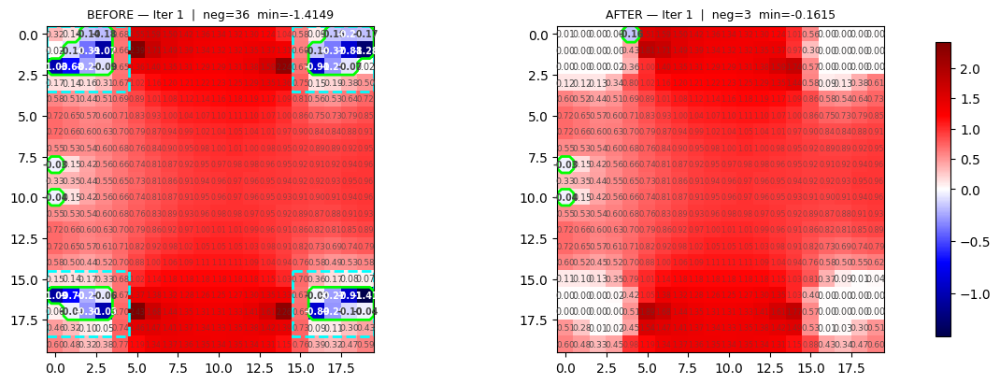

[done] All Jdet > threshold after iter 1

  SUMMARY  (SLSQP — hybrid parallel)
------------------------------------------------------------
  Grid size        : 20 x 20
  Iterations       : 1  (serial=0, parallel=1)
  Neg-Jdet     36 ->     3
  Min Jdet  -1.414921 -> -0.161484
  L2 error         : 4.057027
  Time             : 1.65s
  Time: 1.65s  |  neg Jdet: 36 -> 3  |  below threshold: 36 -> 15  |  min Jdet: -1.4149 -> -0.1615  |  L2: 4.0570
            x-disp min  x-disp max  y-disp min  y-disp max    Jdet min    Jdet max  neg Jdet
--------------------------------------------------------------------------------------------
   initial     -3.9996      3.9996      0.0000      0.0000     -1.4149      2.4256        36
 corrected     -3.1973      3.9996     -0.7961      0.7577     -0.1615      1.8857         3


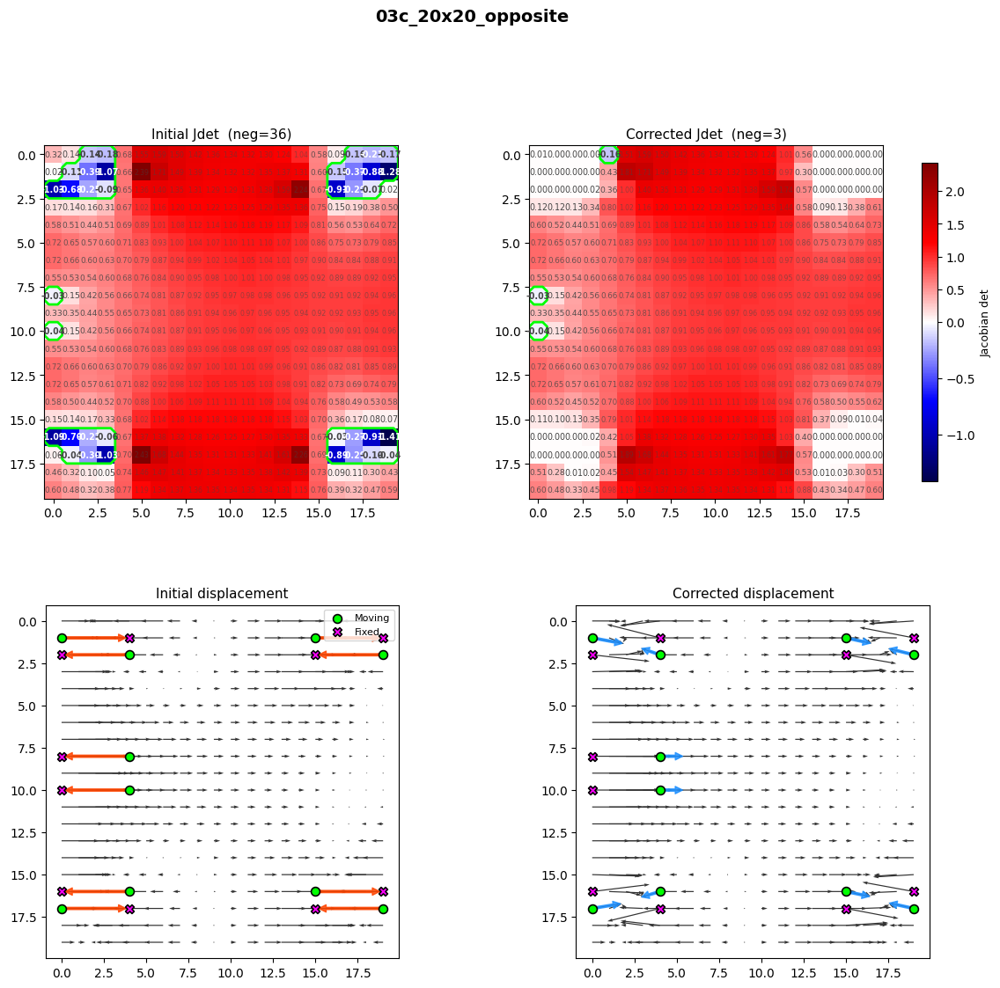

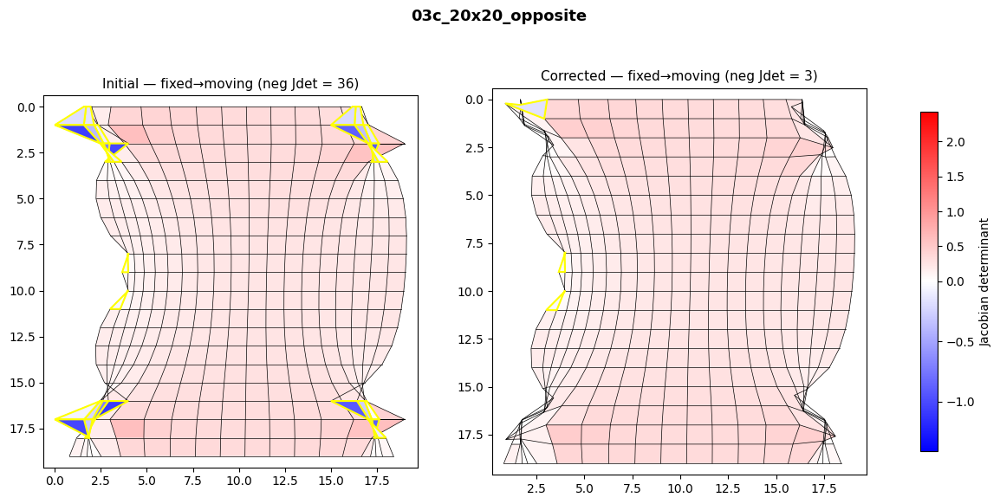

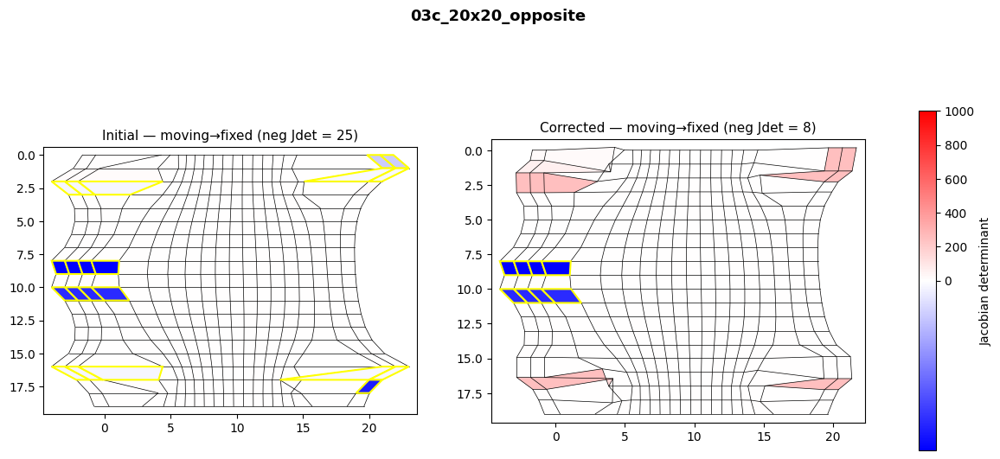

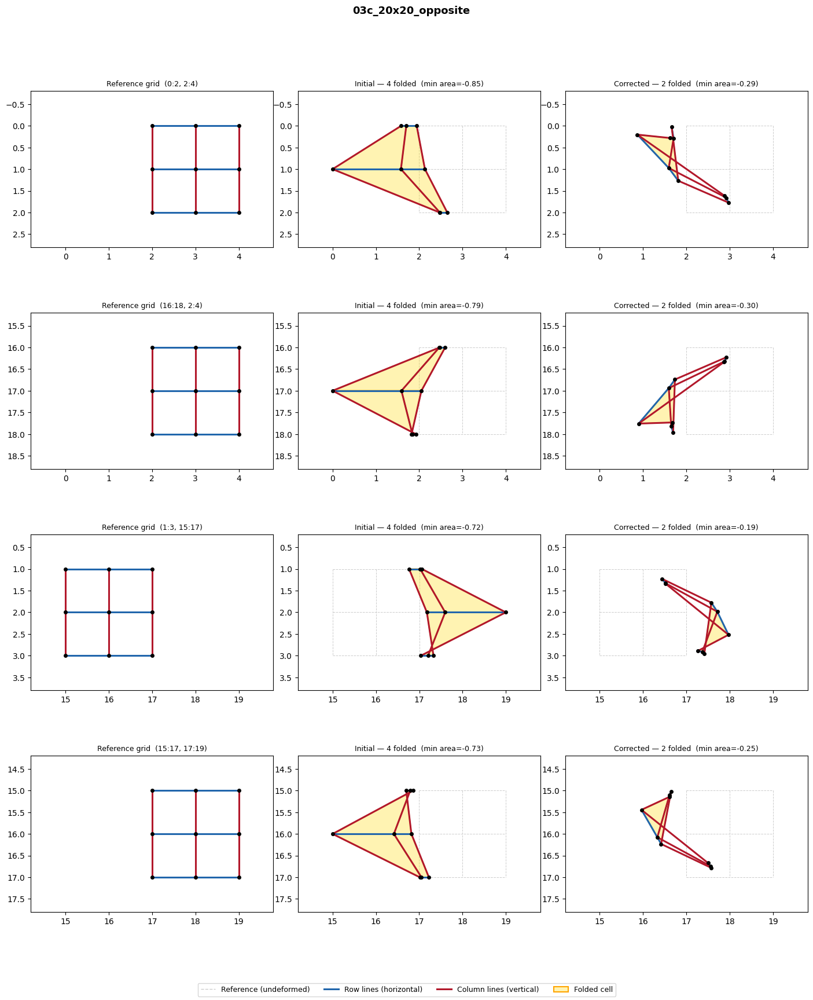

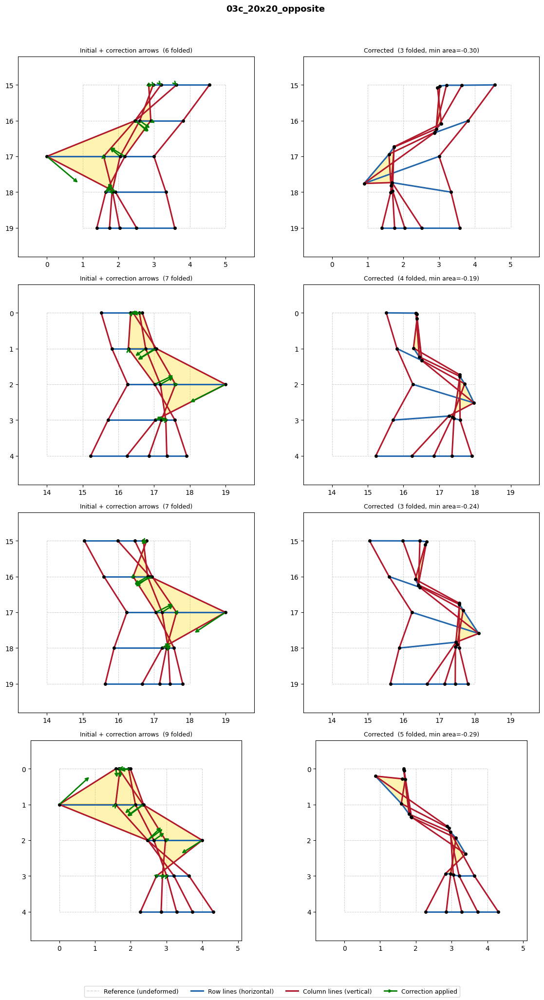

In [12]:
deformation, ms, fs = make_deformation("03c_20x20_opposite")
run_and_show("03c_20x20_opposite", deformation, ms, fs)


  03d_20x20_crossing  |  20x20  |  neg Jdet: 30  |  below threshold (0.001): 30  |  min Jdet: -1.0155


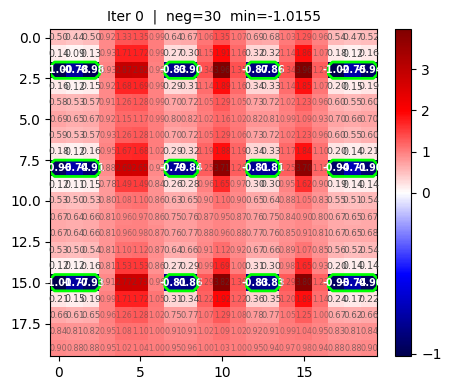

[init] Grid 20x20  |  threshold=0.001  |  method=SLSQP  |  workers=24
[init] Neg-Jdet pixels: 30  |  min Jdet: -1.015545
[iter    1]  parallel  batch=12  neg_pixels=24  windows=3x4,3x4,3x4,3x4,3x4,3x4,3x4,3x4,3x4,3x4,3x4,3x4
         -> neg_jdet    11  min_jdet -0.038646  L2 8.0016


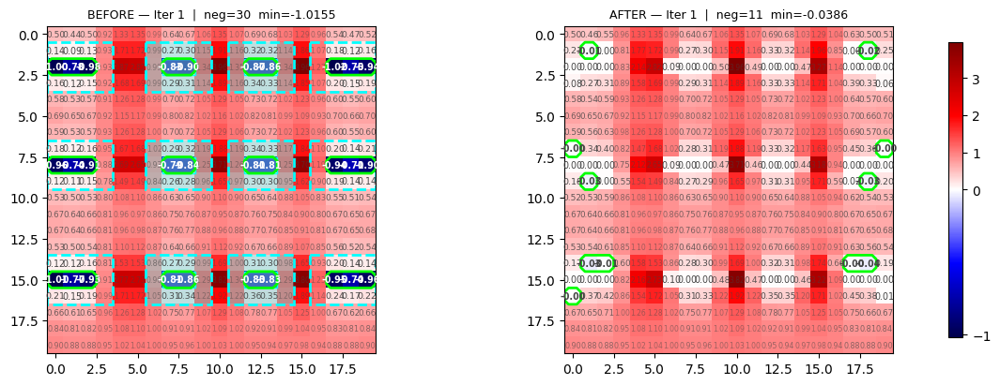

[iter    2]  parallel  batch=6  neg_pixels=9  windows=3x4,3x4,3x3,3x4,3x3,3x3
         -> neg_jdet    22  min_jdet -0.975662  L2 7.0881
  [escalate] parallel didn't improve (11->22), global min window -> 5x5


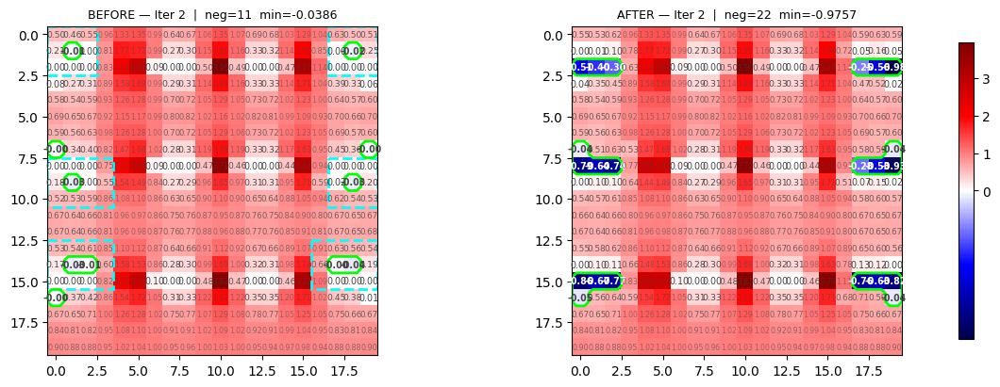

[iter    3]  parallel  batch=6  neg_pixels=12  windows=5x5,5x5,5x5,5x5,5x5,5x5
         -> neg_jdet     2  min_jdet -0.018256  L2 7.4490


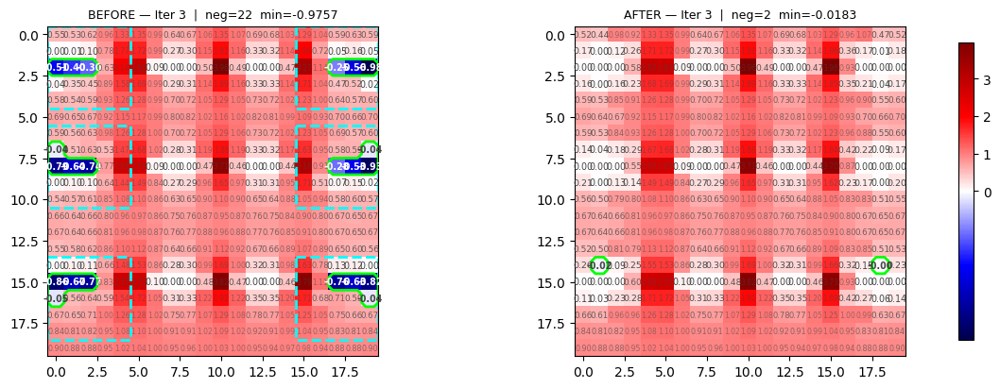

[iter    4]  parallel  batch=2  neg_pixels=2  windows=5x5,5x5
         -> neg_jdet     0  min_jdet +0.001000  L2 7.4483


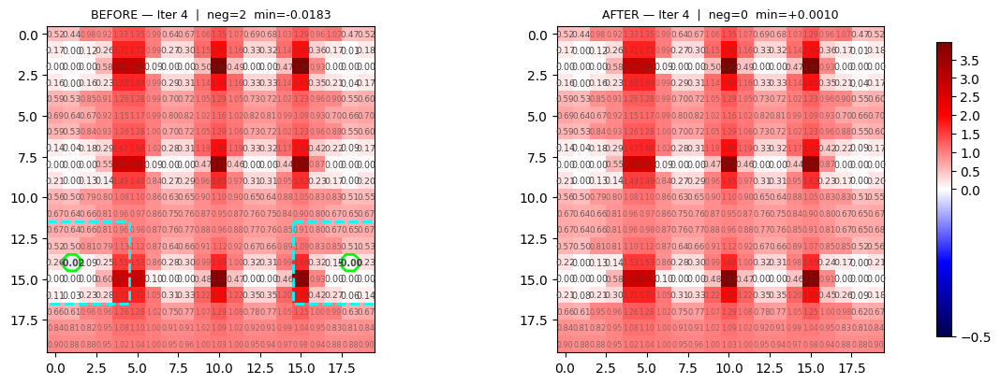

[done] All Jdet > threshold after iter 4

  SUMMARY  (SLSQP — hybrid parallel)
------------------------------------------------------------
  Grid size        : 20 x 20
  Iterations       : 4  (serial=0, parallel=4)
  Neg-Jdet     30 ->     0
  Min Jdet  -1.015545 -> +0.001000
  L2 error         : 7.448300
  Time             : 5.13s
  Time: 5.14s  |  neg Jdet: 30 -> 0  |  below threshold: 30 -> 12  |  min Jdet: -1.0155 -> 0.0010  |  L2: 7.4483
            x-disp min  x-disp max  y-disp min  y-disp max    Jdet min    Jdet max  neg Jdet
--------------------------------------------------------------------------------------------
   initial     -2.9998      2.9998     -2.9998     -1.9750     -1.0155      3.9628        30
 corrected     -3.0006      3.0002     -3.8723     -0.9931      0.0010      3.9630         0


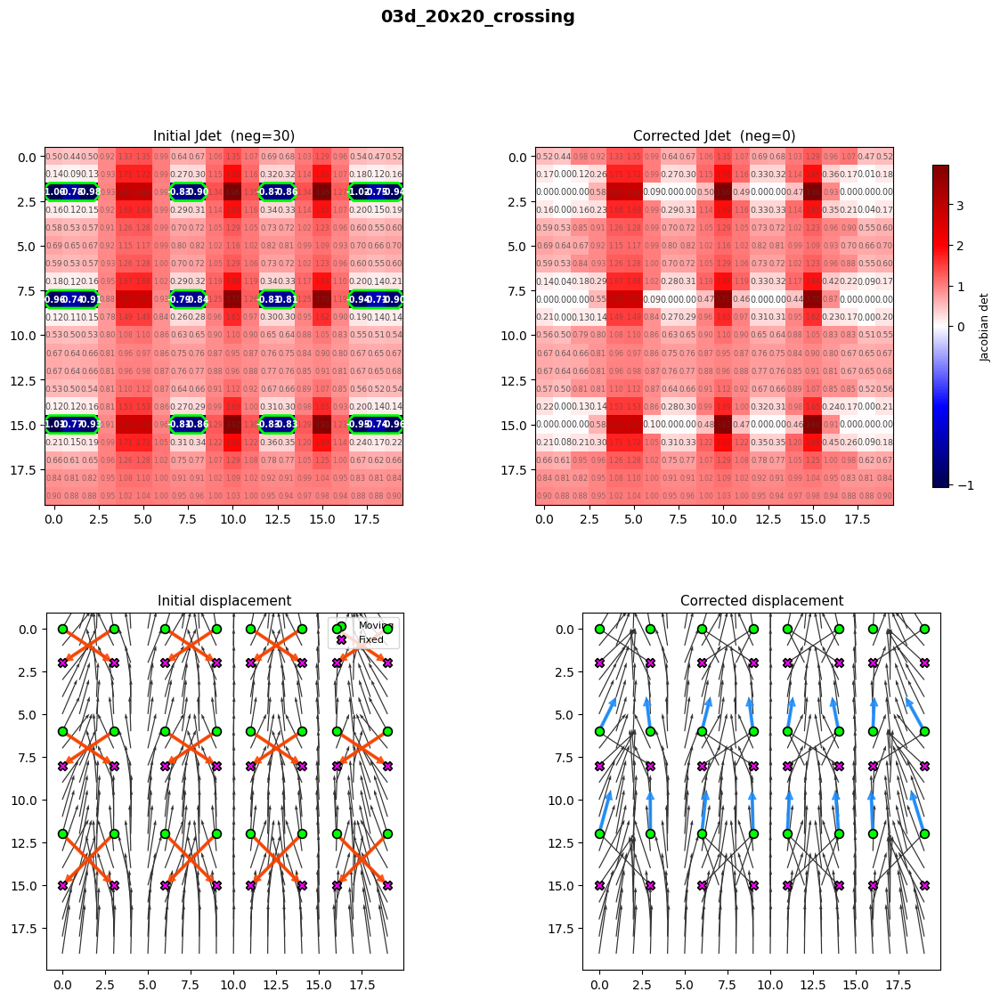

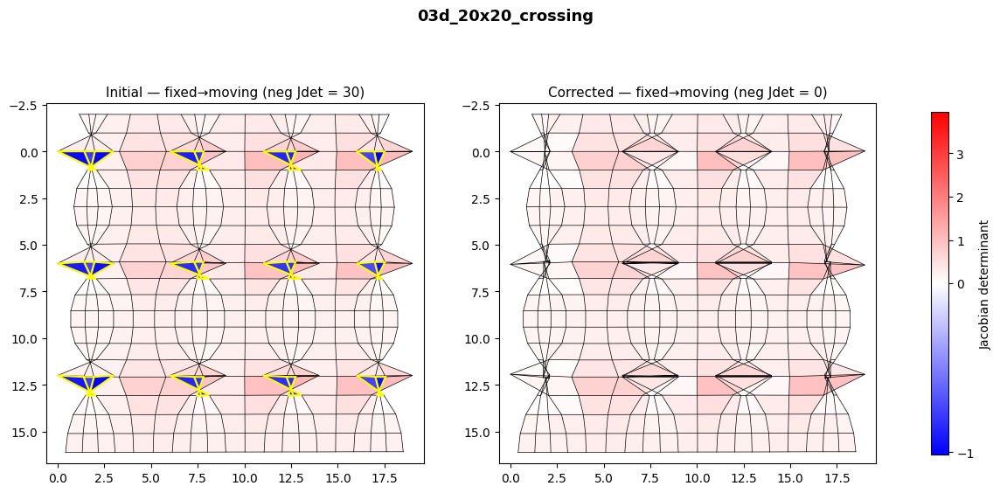

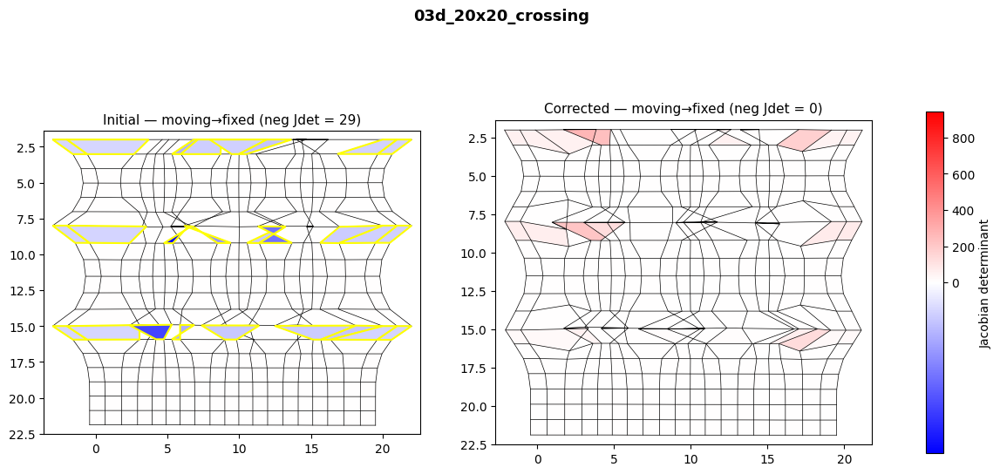

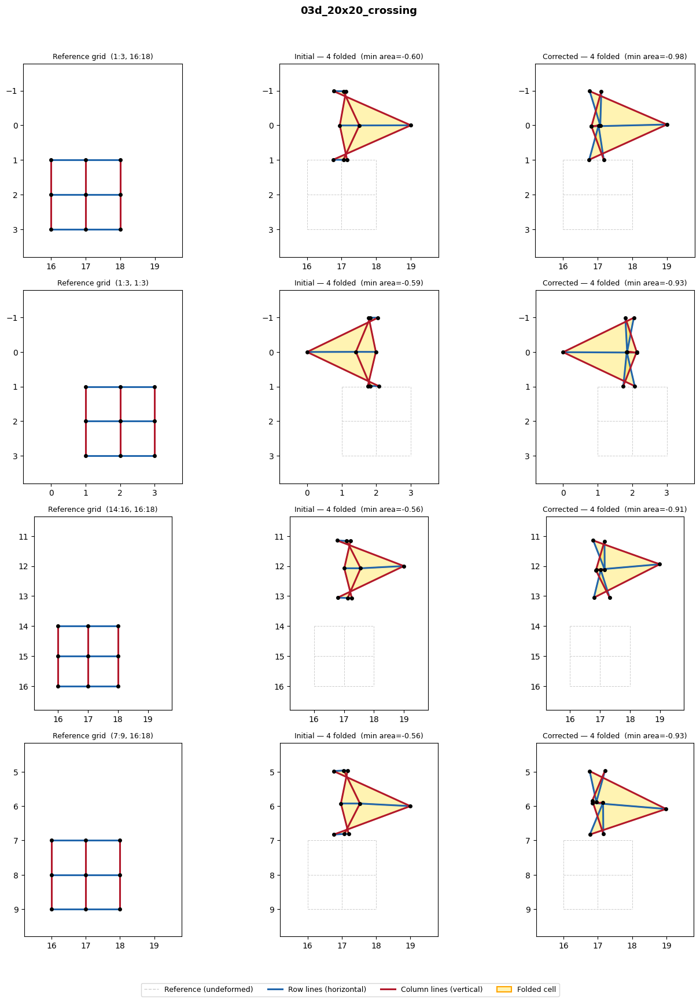

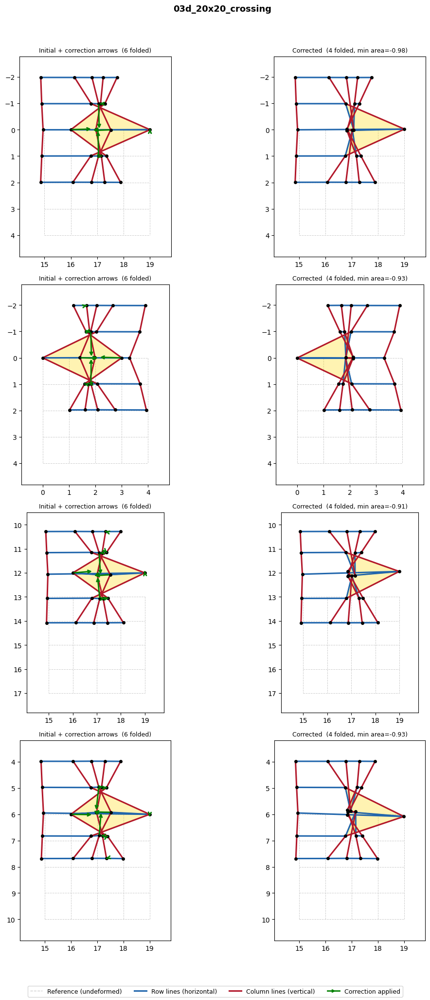

In [13]:
deformation, ms, fs = make_deformation("03d_20x20_crossing")
run_and_show("03d_20x20_crossing", deformation, ms, fs)

### Random DVF variants

In [14]:
# Skipped â€” random DVFs take too long
# for key in ["03a_10x10_random_seed_42", "03c_20x20_random_seed_42"]:
#     dvf = make_random_dvf(key)
#     run_and_show(key, dvf)

## Summary â€” collect all results

In [15]:
result_dirs = sorted(glob.glob(f"{OUTPUT_DIR}/*/results.txt"))

print(f"{'Case':<35s}  {'Grid':>9s}  {'Time (s)':>9s}  {'L2':>10s}  {'Neg init':>8s}  {'Neg final':>9s}  {'Min Jdet':>10s}")
print("-" * 100)

for path in result_dirs:
    case_name = os.path.basename(os.path.dirname(path))
    lines = open(path).read()

    def _extract(label):
        for line in lines.splitlines():
            if label in line:
                return line.split(":")[-1].strip().split()[0]
        return "?"

    grid = _extract("resolution")
    runtime = _extract("run-time")
    l2 = _extract("Final L2")
    neg_start = _extract("Starting number of non-positive")
    neg_final = _extract("Final number of non-positive")
    min_jdet = _extract("Final Jacobian determinant minimum")

    print(f"{case_name:<35s}  {grid:>9s}  {runtime:>9s}  {l2:>10s}  {neg_start:>8s}  {neg_final:>9s}  {min_jdet:>10s}")

Case                                      Grid   Time (s)          L2  Neg init  Neg final    Min Jdet
----------------------------------------------------------------------------------------------------
01a_10x10_crossing                          10  0.6282260417938232  2.2338262933442095         9          0  0.0009998734985595188
01b_10x10_opposite                          10  0.419872522354126  1.4558123380677983         6          0  0.0009999998100437557
01c_20x40_edges                             20  14.35488247871399  2.9432919124429846        29          0  0.0009999071344919397
01d_20x40_crossing                          20  14.57080626487732  15.959879338038457       158          0  0.0009999032921643725
02a_64x91                                   64  3.8636248111724854  0.5629081729816618         3          0  0.0009998858165796987
02b_64x91                                   64  6.7081639766693115  0.23307710054138542         4          0  0.0009999887021957532
02c_64x91   